In [1]:
import matplotlib.pyplot as plt
import holopy as hp
from holopy.scattering import Scatterer, Sphere, calc_holo, calc_field, Spheres, Ellipsoid
from holopy.scattering.theory import Lens, DDA
from holopy.core.utils import ensure_array
import numpy as np
import scipy as sp
import pandas as pd
from scipy import interpolate
import skimage.transform
import gc, os

In [2]:
s1 = Sphere(r = 0.02, center = (0, -0.2, 0))
s2 = Sphere(r = 0.02, center = (0, 0.2, 0))
s11 = Sphere(n = 1.6, r = 0.5, center = (5, 5, 2))
s22 = Sphere(n = 1.6, r = 0.5, center = (4, 4, 2))
single = Sphere(n = 0.05+1j*2.1, r = 0.5, center = (2.5,2.5,2.5))
detector = hp.detector_grid(100, .01)
dumbbell = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0)) #0.05+1j*2.1
#dumbbell = Spheres([s11,s22])
len_dda = Lens(1.38, DDA())

In [3]:
np.sin(1.38)*1.515

1.487508098514125

In [ ]:
from holopy.scattering import calc_cross_sections
s = Ellipsoid(n = 0.05+1j*2.1, r = (0.04,0.02,0.02))
x_sec = calc_cross_sections(s, 1., 0.4, illum_polarization=(1,0))

In [6]:
x_sec

<xarray.DataArray (cross_section: 4)>
array([1.924808e+00, 4.440892e-16, 1.924808e+00, 6.705676e-01])
Coordinates:
  * cross_section  (cross_section) <U10 'scattering' ... 'assymetry'

In [3]:
_='''
print(s1.parameters)
print(s1.bounds)
print(s1.voxelate(0.05).sum())
print()
print(dumbbell.parameters)
print(s1.bounds)
print(s2.bounds)

print(dumbbell.bounds)
print(dumbbell.center)
'''

In [8]:
bond = np.array(dumbbell.bounds)
c = dumbbell.center
for i,b in enumerate(bond):
    #if b[0]>c[i]-0.5: bond[i,0] = min(s1.bounds[i][0]+c[i], s2.bounds[i][0]+c[i], c[i]-0.5)
    #if b[1]<c[i]+0.5: bond[i,1] = max(s1.bounds[i][1]+c[i], s2.bounds[i][1]+c[i], c[i]+0.5)
    #if b[0]>c[i]-0.5: bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0], -0.5)
    #if b[1]<c[i]+0.5: bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1], 0.5)
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0], -0.5)
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1], 0.5)

print(bond)
dumbbell.indicators.bound = bond
print(dumbbell.bounds)

[[-0.5  0.5]
 [-0.5  0.5]
 [-0.5  0.5]]
[(0.0, 1.0), (0.0, 1.0), (-0.5, 0.5)]


## Two spheres, polarisation by rotation

In [4]:
import skimage.transform

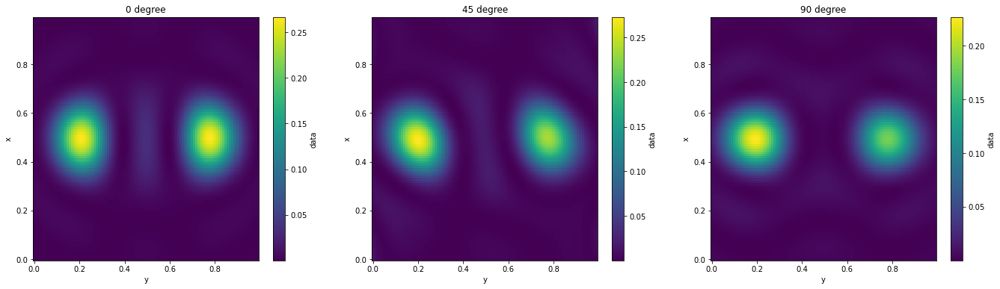

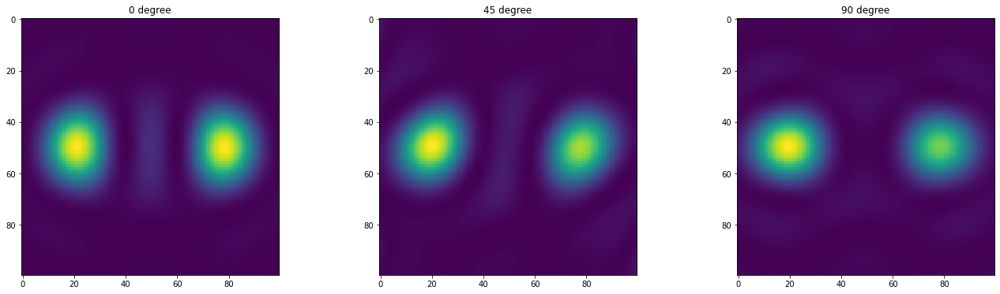

In [11]:
s1 = Sphere(r = 0.05, center = (0, -0.3, 0))
s2 = Sphere(r = 0.05, center = (0, 0.3, 0))
detector = hp.detector_grid(100, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

fig, axes = plt.subplots(1, 3, figsize=(23, 6))
axes = np.ravel(axes)
for i,th in enumerate([0,45,90]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo[...,0] = skimage.transform.rotate(holo[...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo.plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(23, 6))
axes = np.ravel(axes)
for i,th in enumerate([0,45,90]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo = skimage.transform.rotate(holo[...,0], angle=-1*th, mode='symmetric', order=3)
    axes[i].imshow(holo)
    #holo.plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

## Two ellipsoids, polarisation by rotation

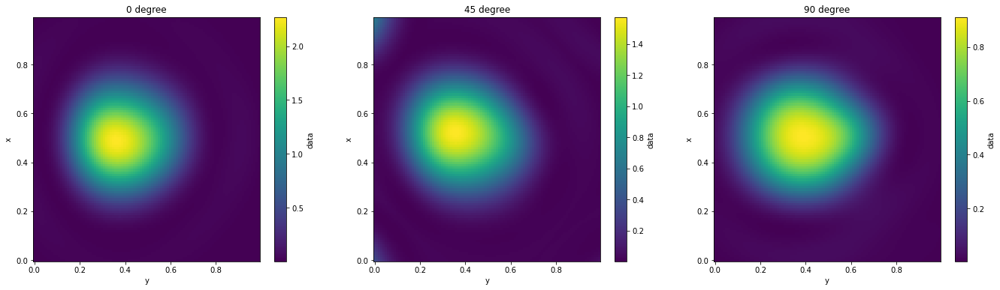

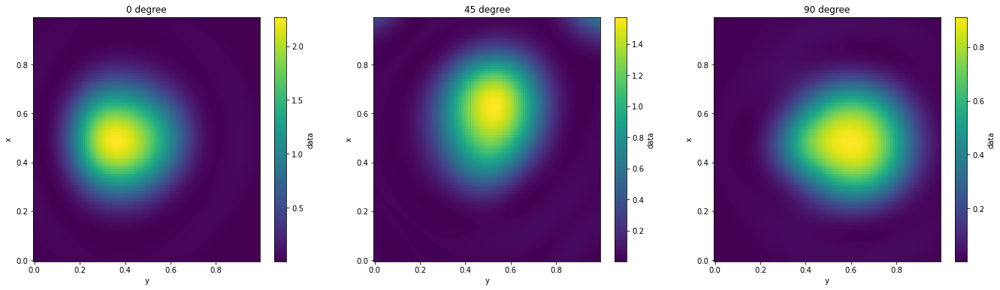

In [15]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(100, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

fig, axes = plt.subplots(1, 3, figsize=(23, 6))
axes = np.ravel(axes)
for i,th in enumerate([0,45,90]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo[...,0] = skimage.transform.rotate(holo[...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo.plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(23, 6))
axes = np.ravel(axes)
for i,th in enumerate([0,45,90]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo[...,0] = skimage.transform.rotate(holo[...,0], angle=th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo.plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

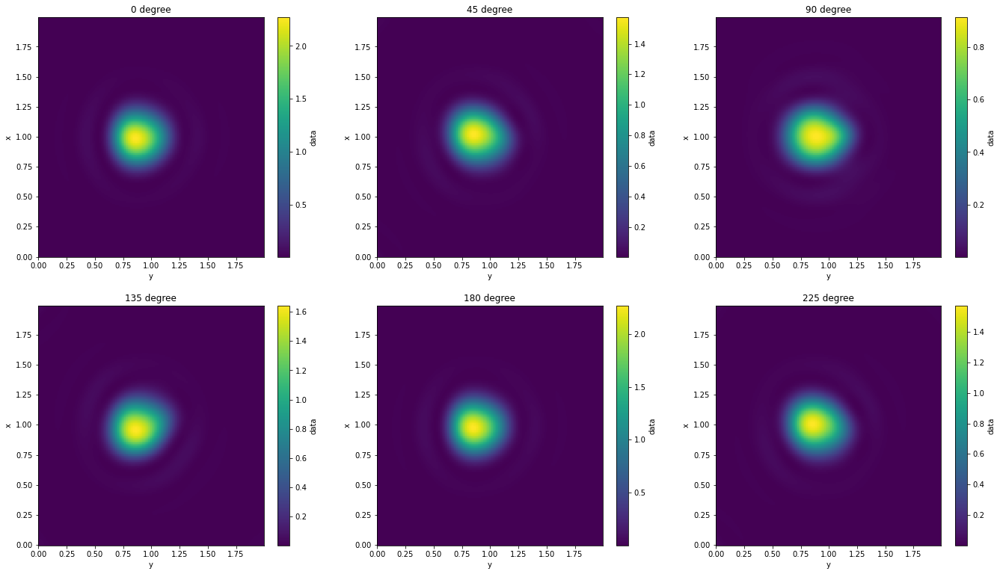

In [12]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,45,90,135,180,225]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo[...,0] = skimage.transform.rotate(holo[...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo.plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()



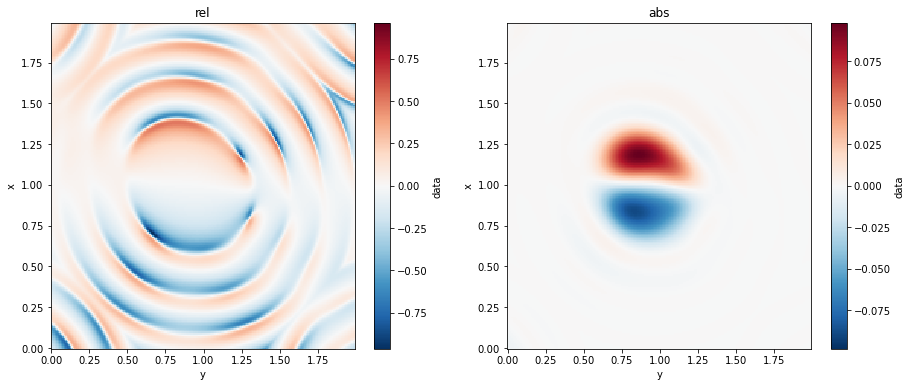

In [11]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 45
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = 225
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
holo.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

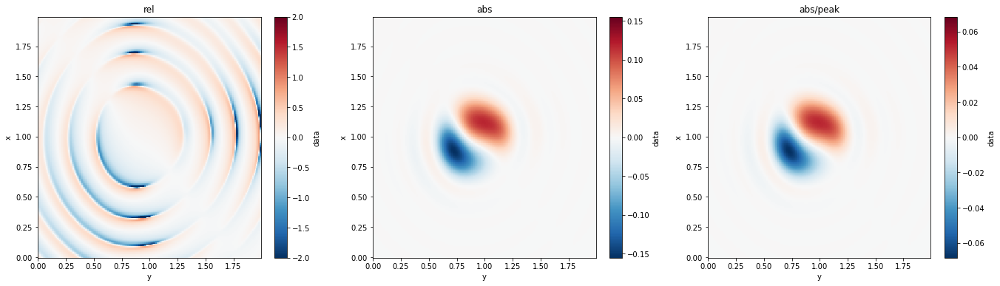

In [25]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 0
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = 180
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 3, figsize=(23, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
hol_np = (holo.values)[...,0]
for i,row in enumerate(hol_np):
    for j,elem in enumerate(row):
        hol_np[i,j] = min(elem, 2)
        hol_np[i,j] = max(elem, -2)
holo[...,0] = hol_np
holo.plot(ax=axes[0])
axes[0].set_title('rel')

holo = (holo45-holo225)
holo.plot(ax=axes[1])
axes[1].set_title('abs')

holo = (holo45-holo225)/np.max(holo45)
holo.plot(ax=axes[2])
axes[2].set_title('abs/peak')
plt.show()

In [5]:
def calc_unpolar(detector, scat, medium_index=1., illum_wavelen=0.4, theory=None):
    # X
    holo = calc_field(detector, scat, medium_index=medium_index, illum_wavelen=illum_wavelen, illum_polarization=(1,0), theory=theory)
    holo_x = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
    holo_x.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
    holo_x.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
    holo_x.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
    holo_x.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))


    # Y
    holo = calc_field(detector, scat, medium_index=medium_index, illum_wavelen=illum_wavelen, illum_polarization=(0,1), theory=theory)
    holo_y = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
    holo_y.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
    holo_y.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
    holo_y.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
    holo_y.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))
    return (holo_x + holo_y)/2

In [6]:
def apply_pol(holo_unp, th):
    return holo_unp.sel(S='I') + holo_unp.sel(S='Q')*np.cos(2*th) + holo_unp.sel(S='U')*np.sin(2*th)

## Filaments

### filaments from the ROOT file

In [24]:
with open('/home/scanner-ml/ML-drive/Artem/Python/NEWS/ADDA/sandbox/tests/filament/fils_table.txt','r') as filtxt:
    tmp_fil = filtxt.read()
tmp_fil = tmp_fil.split('\n')[1:-2]
tmp_cols = [t.strip() for t in tmp_fil[0].split('*')[2:-1]]
tmp_fil = [t.split('*')[2:-1] for t in tmp_fil[2:]]
tmp_ar = np.array([[t.strip() for t in tmp_fil[i]] for i in range(len(tmp_fil))])
tmp_cols

['Instance',
 'event',
 'ncrs',
 'icrs',
 'nlim',
 'idfil',
 'crfil',
 'xfil',
 'yfil',
 'zfil']

In [28]:
import pandas as pd
tmp_ar = pd.DataFrame(tmp_ar, columns=tmp_cols)
tmp_ar = tmp_ar.dropna(subset=['xfil','yfil','zfil'])
for col in tmp_ar.columns:
    tmp_ar.loc[:,col] = pd.to_numeric(tmp_ar[col], errors='coerce')
tmp_ar.head()

,Instance,event,ncrs,icrs,nlim,idfil,crfil,xfil,yfil,zfil
2,0,2,1,0.0,2.0,1.0,2.0,-1532.746,-1662.427,771.48089
3,1,2,1,NaN,NaN,1.0,2.0,-1506.281,-1582.114,864.37268
4,2,2,1,NaN,NaN,1.0,2.0,-1519.259,-1556.701,840.24224
5,3,2,1,NaN,NaN,1.0,2.0,-1621.419,-1601.352,996.71777
6,4,2,1,NaN,NaN,1.0,2.0,-1674.797,-1533.618,884.01178


In [29]:
tmp_ar.shape

(17271, 10)

In [30]:
tmp_ar.to_csv('fil_table.csv')
tmp_csv = pd.read_csv('fil_table.csv', index_col=0)
tmp_csv.head(45)

,Instance,event,ncrs,icrs,nlim,idfil,crfil,xfil,yfil,zfil
2,0,2,1,0.0,2.0,1.0,2.0,-1532.746,-1662.427,771.48089
3,1,2,1,NaN,NaN,1.0,2.0,-1506.281,-1582.114,864.37268
4,2,2,1,NaN,NaN,1.0,2.0,-1519.259,-1556.701,840.24224
5,3,2,1,NaN,NaN,1.0,2.0,-1621.419,-1601.352,996.71777
6,4,2,1,NaN,NaN,1.0,2.0,-1674.797,-1533.618,884.01178
7,5,2,1,NaN,NaN,2.0,2.0,-1551.587,-1663.560,771.98010
8,6,2,1,NaN,NaN,2.0,2.0,-1568.998,-1620.329,825.08422
9,7,2,1,NaN,NaN,2.0,2.0,-1493.090,-1669.889,839.61743
10,0,3,1,0.0,2.0,1.0,7.0,-1897.037,-1486.146,788.73938
11,1,3,1,NaN,NaN,1.0,7.0,-1913.615,-1478.164,836.55767


In [31]:
tmp_gr = tmp_ar.groupby('event')
for gr, gr_ids in tmp_gr:
    print(gr)
    gr_event = gr_ids.groupby(['crfil','idfil'])
    for g, gr_ar in gr_event:
        print(g)
        print(gr_ar)
    #print(type(gr_ids))

2
(2.0, 1.0)
   Instance  event  ncrs  icrs  nlim  idfil  crfil      xfil      yfil  \
2         0      2     1   0.0   2.0    1.0    2.0 -1532.746 -1662.427   
3         1      2     1   NaN   NaN    1.0    2.0 -1506.281 -1582.114   
4         2      2     1   NaN   NaN    1.0    2.0 -1519.259 -1556.701   
5         3      2     1   NaN   NaN    1.0    2.0 -1621.419 -1601.352   
6         4      2     1   NaN   NaN    1.0    2.0 -1674.797 -1533.618   

        zfil  
2  771.48089  
3  864.37268  
4  840.24224  
5  996.71777  
6  884.01178  
(2.0, 2.0)
   Instance  event  ncrs  icrs  nlim  idfil  crfil      xfil      yfil  \
7         5      2     1   NaN   NaN    2.0    2.0 -1551.587 -1663.560   
8         6      2     1   NaN   NaN    2.0    2.0 -1568.998 -1620.329   
9         7      2     1   NaN   NaN    2.0    2.0 -1493.090 -1669.889   

        zfil  
7  771.98010  
8  825.08422  
9  839.61743  
3
(7.0, 1.0)
    Instance  event  ncrs  icrs  nlim  idfil  crfil      xfil      yfil

In [32]:
filaments = {}
tmp_gr = tmp_ar.groupby('event')
for ev, ev_ids in tmp_gr:
    filaments[ev] = [f.loc[:,['xfil','yfil','zfil']].values for crid, f in ev_ids.groupby(['crfil','idfil'])]

In [33]:
len(filaments.keys())

2766

In [34]:
list(filaments.keys())[:5]

[2, 3, 12, 13, 15]

In [35]:
print([(k,len(f)) for k,f in filaments.items()][:10])

[(2, 2), (3, 2), (12, 2), (13, 1), (15, 1), (17, 1), (18, 2), (19, 2), (31, 3), (35, 1)]


In [36]:
filament_n = []
for k in filaments.keys():
    filament_n.append([k,len(filaments[k])])
filament_n = np.array(filament_n)

In [37]:
filament_n[filament_n[:,1]>4]

array([[ 876,    5],
       [4924,    5],
       [5037,    5],
       [6377,    5],
       [7302,    5]])

In [38]:
(tmp_ar.loc[(tmp_ar['nlim']>2) & (tmp_ar['icrs']==1)])

,Instance,event,ncrs,icrs,nlim,idfil,crfil,xfil,yfil,zfil
6252,1,2603,2,1.0,3.0,1.0,0.0,-1966.076,-1978.934,717.53808
12824,1,5222,2,1.0,3.0,1.0,0.0,-1706.836,-1797.781,484.30731
17275,1,7064,2,1.0,3.0,1.0,2.0,-1566.596,-1593.889,308.22567
17839,1,7302,2,1.0,3.0,1.0,0.0,-1592.864,-1572.591,423.12365
23833,1,9732,2,1.0,3.0,1.0,1.0,-1944.135,-1770.388,352.88375


In [39]:
(tmp_ar.loc[(tmp_ar['ncrs']>2)])

,Instance,event,ncrs,icrs,nlim,idfil,crfil,xfil,yfil,zfil


### HoloPy simulattion

In [40]:
def sph_rule(coord,R=1,delta=1):
    return np.sum((coord*delta)**2, axis=-1)<R**2


def line_rule(coord, p1=None, p2=None, delta=1.0, R=20):
    p = coord*delta
    l = p-p1; l12 = p2-p1
    d1 = -np.dot(p2-p1,p1); d2 = -np.dot(p2-p1, p2)
    return ((np.linalg.norm(np.cross(l,l12), axis=-1)/np.linalg.norm(l12, axis=-1)<R) * (np.dot(p,l12)+d2<0) * (np.dot(p,l12)+d1>0)) + (np.linalg.norm(l, axis=-1)<R) + (np.linalg.norm(p-p2, axis=-1)<R)# + (np.linalg.norm(l, axis=-1)<delta)

def filament_rule(coord, fil_coord, R=1):
    fill = np.zeros(coord.shape[:-1], dtype=bool)
    for i in range(fil_coord.shape[0]-1): 
        fill += line_rule(coord, p1=fil_coord[i], p2=fil_coord[i+1], delta=1, R=R)
    return fill

In [41]:
def bright_cen(img, w=12):
    sh = img.shape
    peak = np.array(np.unravel_index(np.argmax(img),sh))
    peak[peak<w] = w
    bright = img[peak[0]-w:peak[0]+w+1,peak[1]-w:peak[1]+w+1]
    x,y = np.meshgrid(range(-w,w+1),range(-w,w+1))
    return peak[0]+np.sum(x*bright)/np.sum(bright), peak[1]+np.sum(y*bright)/np.sum(bright)

In [5]:
def calc_unpolar(detector, scat, medium_index=1., illum_wavelen=0.4, theory=None):
    # X
    holo = calc_field(detector, scat, medium_index=medium_index, illum_wavelen=illum_wavelen, illum_polarization=(1,0), theory=theory)
    holo_x = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
    holo_x.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
    holo_x.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
    holo_x.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
    holo_x.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))


    # Y
    holo = calc_field(detector, scat, medium_index=medium_index, illum_wavelen=illum_wavelen, illum_polarization=(0,1), theory=theory)
    holo_y = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
    holo_y.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
    holo_y.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
    holo_y.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
    holo_y.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))
    return (holo_x + holo_y)/2

In [47]:
def apply_pol(holo_un, th):
    return holo_un.sel(S='I') + holo_un.sel(S='Q')*np.cos(2*th) + holo_un.sel(S='U')*np.sin(2*th)

In [42]:
R = 0.01

fil_coord = """-1563.710 -1469.825 680.46649
-1555.468 -1519.575 586.13208
-1561.334 -1545.198 589.48089
-1569.298 -1516.200 593.11993
-1616.233 -1551.463 554.89361""".split('\n')
fil_coord = np.array([f.split(' ') for f in fil_coord], dtype=float)
#print(np.abs(fil_coord[0]-fil_coord[-1]))
for i in range(3): fil_coord[:,i] -= fil_coord[:,i].min()

fil_coord = fil_coord[::-1]/1000
fil_coord += R

fil_bounds = [[np.min(fil_coord[:,0])-2*R, np.max(fil_coord[:,0])+2*R], [np.min(fil_coord[:,1])-2*R, np.max(fil_coord[:,1])+2*R], [np.min(fil_coord[:,2])-2*R, np.max(fil_coord[:,2])+2*R]]

from holopy.scattering.scatterer import Indicators
indi = Indicators(lambda x: filament_rule(x, fil_coord, R=R), bound=fil_bounds)
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0))

In [43]:
copa_fil.bounds

[(0.99, 1.0907649999999998), (0.99, 1.111638), (-0.01, 0.15557288000000005)]

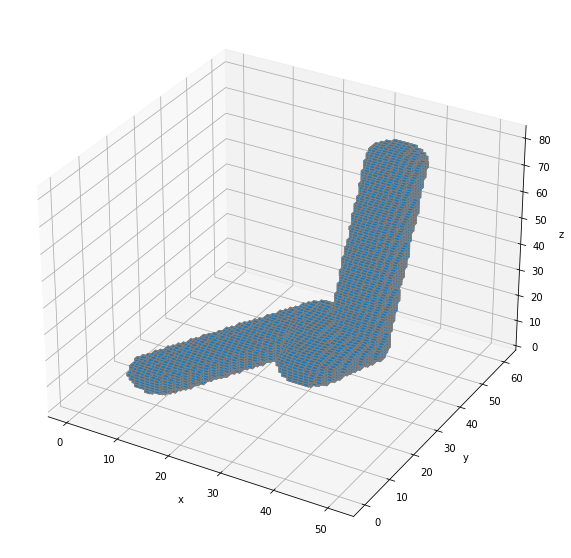

In [44]:
#from holopy.scattering.scatterer import Indicators
#indi = Indicators(lambda x: sph_rule(x, R=0.5, delta=1))
#copa_sph = Scatterer(indi, n=1.5, center=(1,1,0))

from mpl_toolkits.mplot3d import Axes3D
def make_ax(grid=False):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection='3d')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.grid(grid)
    return ax

filam = np.array(copa_fil.voxelate(spacing=0.002), dtype=bool)

#filled = np.zeros((filam[:,0].max()+1, filam[:,1].max()+1, filam[:,2].max()+1), dtype=bool)
#for c in filam:
#    filled[c[0],c[1],c[2]] = True

ax = make_ax(True)
ax.voxels(filam, edgecolors='gray', shade=False)
plt.show()

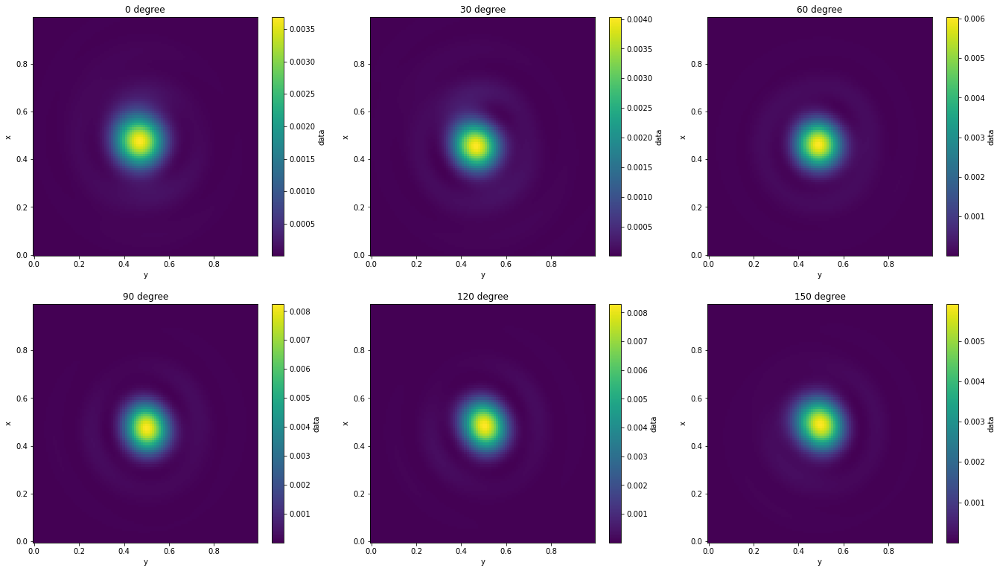

CPU times: user 21 s, sys: 1.57 s, total: 22.5 s
Wall time: 55.1 s


In [53]:
%%time
from holopy.scattering.scatterer import Indicators
indi = Indicators(lambda x: filament_rule(x, fil_coord, R=R), bound=fil_bounds)
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(0.5,0.5,0))
detector = hp.detector_grid(100, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002))
holo_unp = calc_unpolar(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, theory=len_dda)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

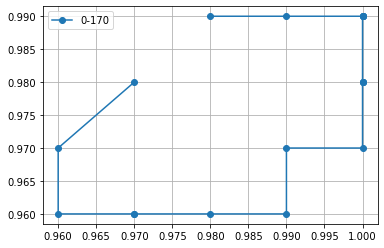

In [50]:
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    br_peak.append(np.unravel_index(np.argmax(holo_fil[th].values),(200,200)))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

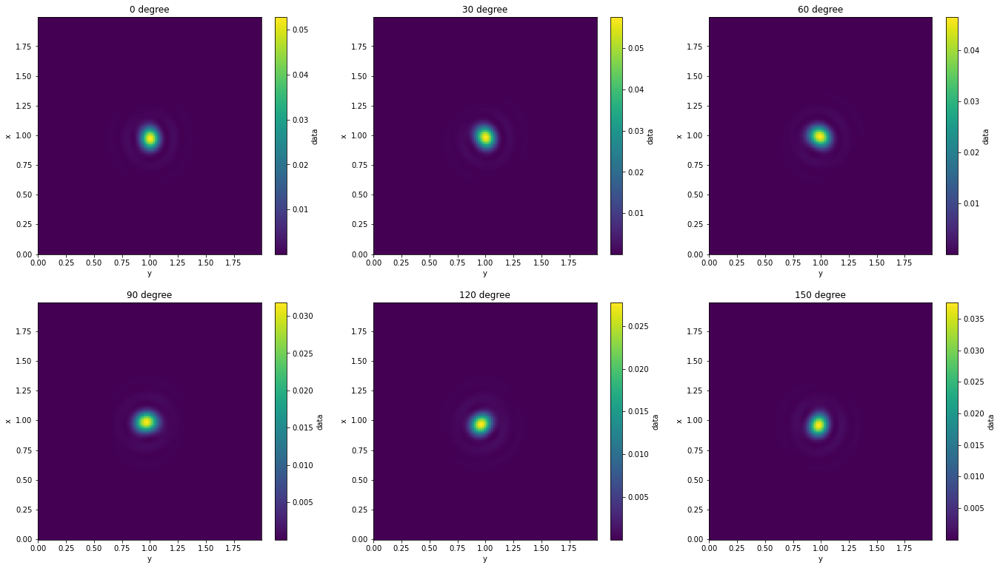

CPU times: user 5min 32s, sys: 10.5 s, total: 5min 43s
Wall time: 2min 19s


In [122]:
%%time
from holopy.scattering.scatterer import Indicators
indi = Indicators(lambda x: filament_rule(x, fil_coord, R=R), bound=fil_bounds)
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0))
detector = hp.detector_grid(200, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

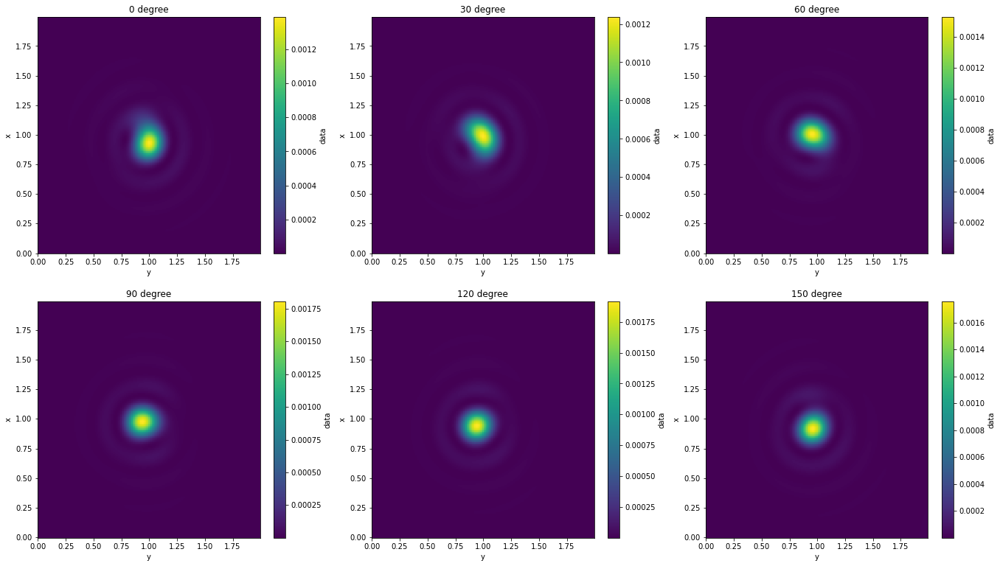

CPU times: user 5min 31s, sys: 10.3 s, total: 5min 41s
Wall time: 2min 35s


In [126]:
%%time
from holopy.scattering.scatterer import Indicators
indi = Indicators(lambda x: filament_rule(x, fil_coord, R=R), bound=fil_bounds)
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0))
detector = hp.detector_grid(200, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

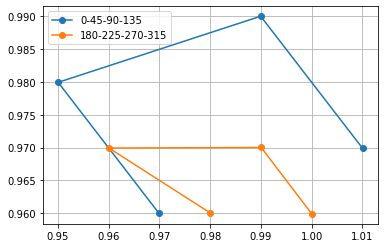

In [125]:
br_peak = []
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0.5))
detector = hp.detector_grid(200, .01)
for th in [0,45,90,135,180,225,270,315]:
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    br_peak.append(bright_cen(holo_fil[th][...,0].values, w=2))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-4]*0.01, br_peak[0,:-4]*0.01, '-o', label='0-45-90-135')
plt.plot(br_peak[1,-4:]*0.01, br_peak[0,-4:]*0.01, '-o', label='180-225-270-315')
plt.legend()
plt.grid()

### No Lens

CPU times: user 10 s, sys: 316 ms, total: 10.3 s
Wall time: 2min 17s


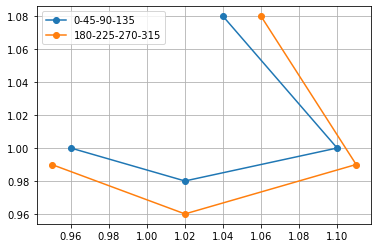

In [124]:
%%time
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0.5))
detector = hp.detector_grid(200, .01)
br_peak_n = []
for th in [0,45,90,135,180,225,270,315]:
    #len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    no_len_dda = DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0'])
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.4, illum_polarization=(1,0), theory=no_len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    br_peak_n.append(bright_cen(holo_fil[th][...,0].values, w=2))
br_peak_n = np.array(br_peak_n).T
plt.plot(br_peak_n[1,:-4]*0.01, br_peak_n[0,:-4]*0.01, '-o', label='0-45-90-135')
plt.plot(br_peak_n[1,-4:]*0.01, br_peak_n[0,-4:]*0.01, '-o', label='180-225-270-315')
plt.legend()
plt.grid()

## Multi-filament

### 1 filament

In [62]:
R = 0.01
fil_center = [0,0,0]
fil_bounds = [[],[],[]]

fil_coord = filaments[17].copy()

for i in range(len(fil_coord)): fil_coord[i] = fil_coord[i][::-1]/1000

for i in range(3): 
    fil_bounds[i] = [min([f[:,i].min() for f in fil_coord])-R,max([f[:,i].max() for f in fil_coord])+R]
    fil_center[i] = sum(fil_bounds[i])/2
    for j in range(2): fil_bounds[i][j] -= fil_center[i]
for i in range(len(fil_coord)): fil_coord[i] -= fil_center

from holopy.scattering.scatterer import Indicators
indi = Indicators(lambda x: np.sum([filament_rule(x, f, R=R) for f in fil_coord], axis=0, dtype=bool), bound=fil_bounds)
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0))

In [55]:
fil_coord

[array([[-0.0321055 , -0.035492  ,  0.00764646],
        [-0.0270745 ,  0.035492  , -0.07250878],
        [ 0.0321055 ,  0.034707  ,  0.07250877]])]

In [56]:
fil_center

[-1.6467785, -1.963696, 0.25323075500000003]

In [57]:
fil_bounds

[[-0.04210550000000013, 0.04210550000000013],
 [-0.045491999999999866, 0.04549200000000009],
 [-0.08250877500000003, 0.08250877499999998]]

In [58]:
copa_fil.bounds

[(0.9578944999999999, 1.0421055000000001),
 (0.9545080000000001, 1.045492),
 (-0.08250877500000003, 0.08250877499999998)]

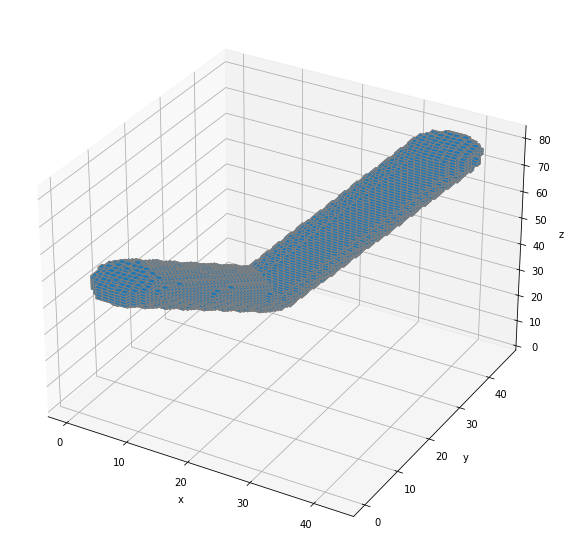

CPU times: user 11.6 s, sys: 76.5 ms, total: 11.7 s
Wall time: 11.6 s


In [60]:
%%time
#from holopy.scattering.scatterer import Indicators
#indi = Indicators(lambda x: sph_rule(x, R=0.5, delta=1))
#copa_sph = Scatterer(indi, n=1.5, center=(1,1,0))

from mpl_toolkits.mplot3d import Axes3D
def make_ax(grid=False):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection='3d')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.grid(grid)
    return ax

filam = np.array(copa_fil.voxelate(spacing=0.002), dtype=bool)

#filled = np.zeros((filam[:,0].max()+1, filam[:,1].max()+1, filam[:,2].max()+1), dtype=bool)
#for c in filam:
#    filled[c[0],c[1],c[2]] = True

ax = make_ax(True)
ax.voxels(filam, edgecolors='gray', shade=False)
plt.show()

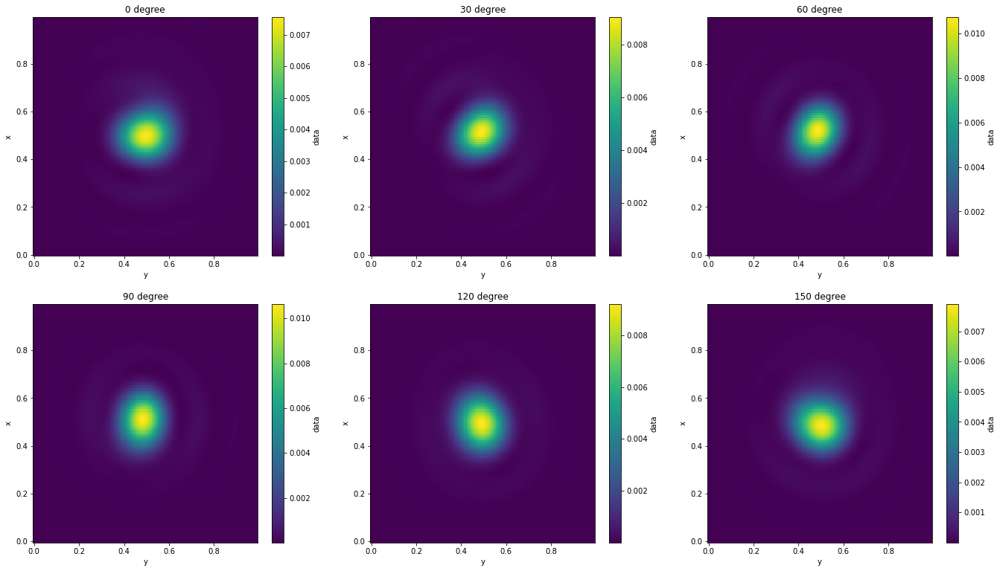

CPU times: user 20.7 s, sys: 1.45 s, total: 22.2 s
Wall time: 1min 17s


In [63]:
%%time
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(0.5,0.5,0))
detector = hp.detector_grid(100, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002))
holo_unp = calc_unpolar(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, theory=len_dda)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

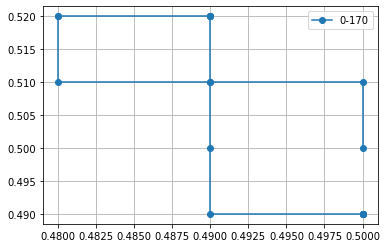

In [65]:
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    br_peak.append(np.unravel_index(np.argmax(holo_fil[th].values),(100,100)))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

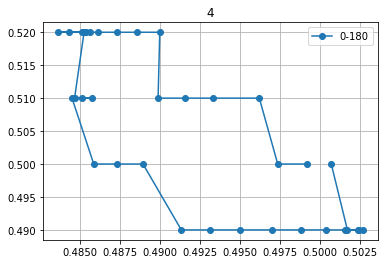

In [68]:
w = 4
br_peak = []
for th in np.linspace(0,180,36, endpoint=False):
    br_peak.append(bright_cen(apply_pol(holo_unp, th*np.pi/180).values, w=w))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:]*0.01, br_peak[0,:]*0.01, '-o', label='0-180')
plt.legend()
plt.grid()
plt.title(str(w))
plt.show()

In [345]:
0.465/1.515

0.306930693069307

### 2 filament

In [79]:
R = 0.01
fil_center = [0,0,0]
fil_bounds = [[],[],[]]

fil_coord = filaments[3].copy()

for i in range(len(fil_coord)): fil_coord[i] = fil_coord[i][::-1]/1000

for i in range(3): 
    fil_bounds[i] = [min([f[:,i].min() for f in fil_coord])-R,max([f[:,i].max() for f in fil_coord])+R]
    fil_center[i] = sum(fil_bounds[i])/2
    for j in range(2): fil_bounds[i][j] -= fil_center[i]
for i in range(len(fil_coord)): fil_coord[i] -= fil_center

from holopy.scattering.scatterer import Indicators
indi = Indicators(lambda x: np.sum([filament_rule(x, f, R=R) for f in fil_coord], axis=0, dtype=bool), bound=fil_bounds)
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0))

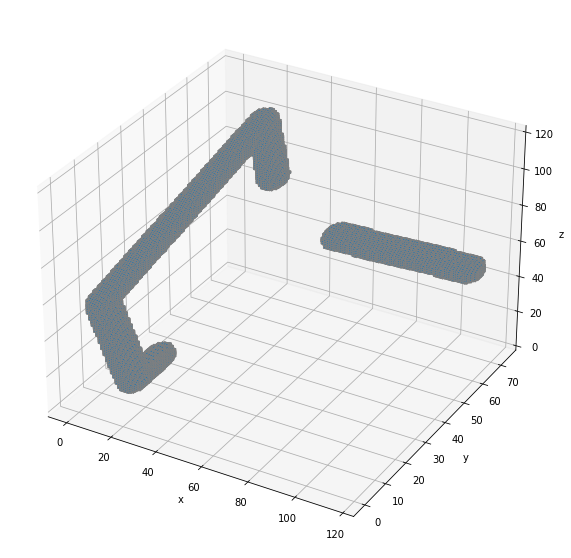

CPU times: user 45.9 s, sys: 732 ms, total: 46.6 s
Wall time: 45.7 s


In [80]:
%%time
#from holopy.scattering.scatterer import Indicators
#indi = Indicators(lambda x: sph_rule(x, R=0.5, delta=1))
#copa_sph = Scatterer(indi, n=1.5, center=(1,1,0))

from mpl_toolkits.mplot3d import Axes3D
def make_ax(grid=False):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection='3d')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.grid(grid)
    return ax

filam = np.array(copa_fil.voxelate(spacing=0.002), dtype=bool)

#filled = np.zeros((filam[:,0].max()+1, filam[:,1].max()+1, filam[:,2].max()+1), dtype=bool)
#for c in filam:
#    filled[c[0],c[1],c[2]] = True

ax = make_ax(True)
ax.voxels(filam, edgecolors='gray', shade=False)
plt.show()

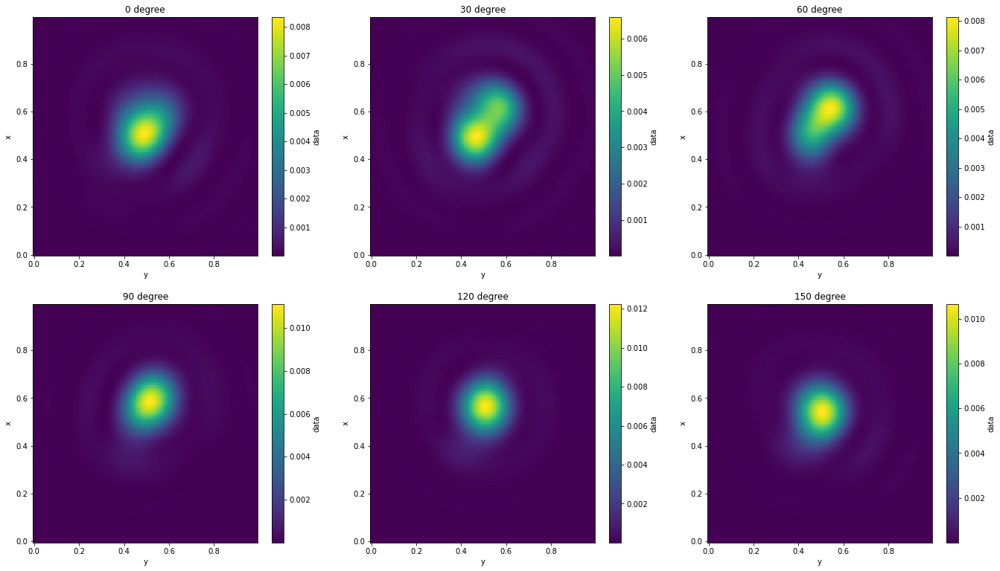

CPU times: user 22.2 s, sys: 1.58 s, total: 23.8 s
Wall time: 6min 12s


In [81]:
%%time
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(0.5,0.5,0))
detector = hp.detector_grid(100, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002))
holo_unp = calc_unpolar(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, theory=len_dda)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

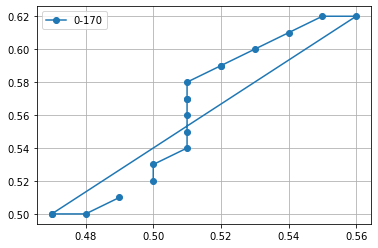

In [72]:
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    br_peak.append(np.unravel_index(np.argmax(holo_fil[th].values),(100,100)))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

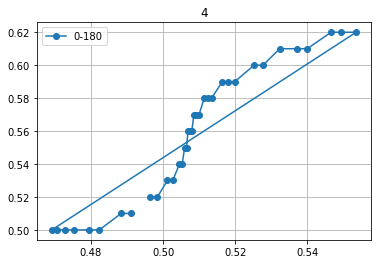

In [73]:
w = 4
br_peak = []
for th in np.linspace(0,180,36, endpoint=False):
    br_peak.append(bright_cen(apply_pol(holo_unp, th*np.pi/180).values, w=w))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:]*0.01, br_peak[0,:]*0.01, '-o', label='0-180')
plt.legend()
plt.grid()
plt.title(str(w))
plt.show()

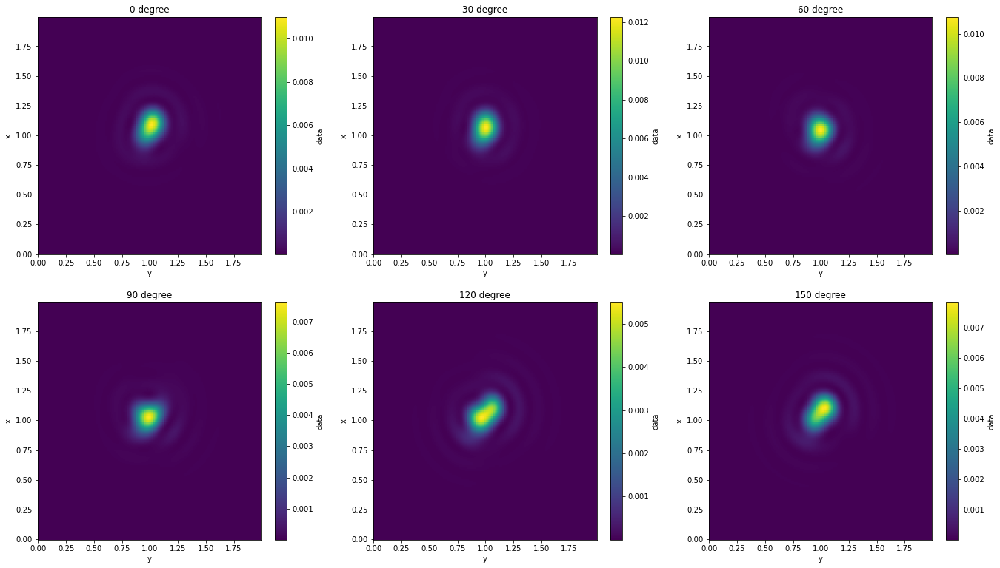

CPU times: user 5min 35s, sys: 11.1 s, total: 5min 46s
Wall time: 18min 50s


In [215]:
%%time
#copa_fil = Scatterer(indi, n=1.5658+1j*0.7444, center=(1,1,0))
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(1,1,0))
detector = hp.detector_grid(200, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

CPU times: user 24 ms, sys: 29 µs, total: 24 ms
Wall time: 23.3 ms


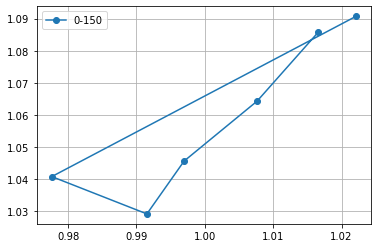

In [216]:
%%time
br_peak = []
for th in [0,30,60,90,120,150]:
    br_peak.append(bright_cen(holo_fil[th][...,0].values))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:]*0.01, br_peak[0,:]*0.01, '-o', label='0-150')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

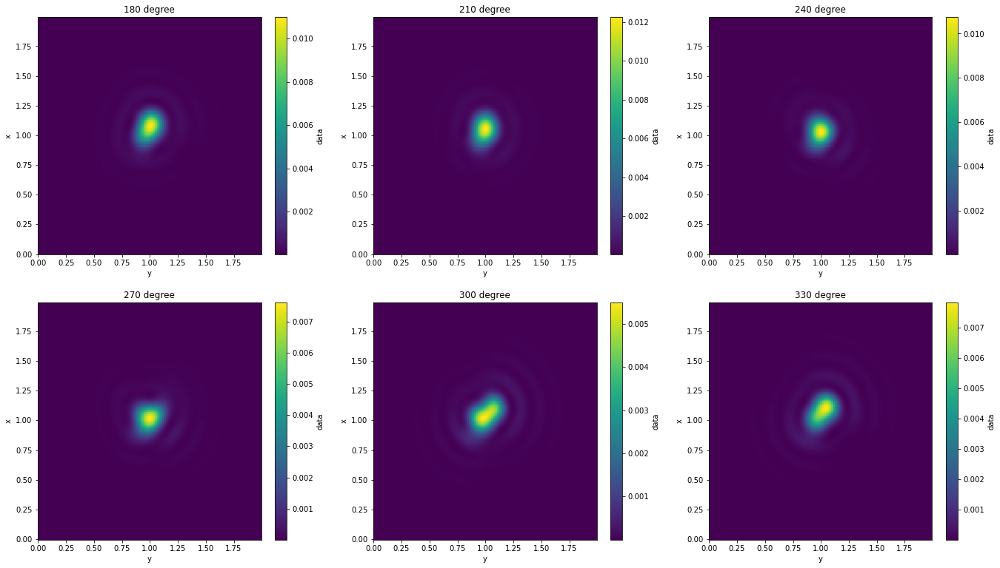

CPU times: user 5min 37s, sys: 11 s, total: 5min 48s
Wall time: 18min 48s


In [91]:
%%time
#copa_fil = Scatterer(indi, n=1.5658+1j*0.7444, center=(1,1,0))
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(1,1,0))
detector = hp.detector_grid(200, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([180,210,240,270,300,330]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

CPU times: user 20.3 ms, sys: 3.68 ms, total: 23.9 ms
Wall time: 23 ms


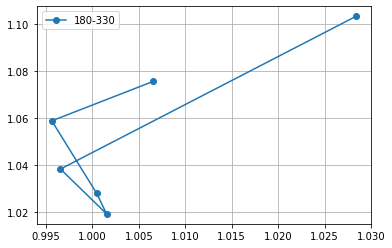

In [92]:
%%time
br_peak_c = []
for th in [180,210,240,270,300,330]:
    br_peak_c.append(bright_cen(holo_fil[th][...,0].values))
br_peak_c = np.array(br_peak_c).T
plt.plot(br_peak_c[1,:]*0.01, br_peak_c[0,:]*0.01, '-o', label='180-330')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

CPU times: user 33min 31s, sys: 1min 5s, total: 34min 37s
Wall time: 1h 53min 48s


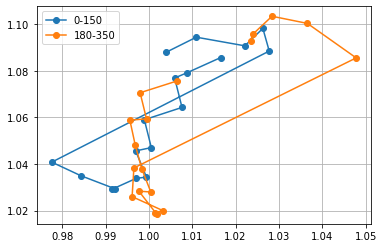

In [116]:
%%time
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(1,1,0))
detector = hp.detector_grid(200, .01)
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    br_peak.append(bright_cen(holo_fil[th][...,0].values))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-150')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

CPU times: user 39.9 ms, sys: 38 µs, total: 40 ms
Wall time: 39.2 ms


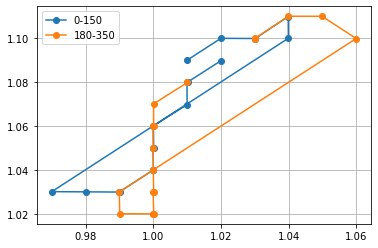

In [117]:
%%time
br_peak_c = []
for th in np.linspace(0,360,36, endpoint=False):
    br_peak_c.append(bright_cen(holo_fil[th][...,0].values, w=2))
br_peak_c = np.array(br_peak_c).T
plt.plot(br_peak_c[1,:-18]*0.01, br_peak_c[0,:-18]*0.01, '-o', label='0-150')
plt.plot(br_peak_c[1,-18:]*0.01, br_peak_c[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

### 5 filaments

In [74]:
R = 0.01
fil_center = [0,0,0]
fil_bounds = [[],[],[]]

fil_coord = filaments[6377].copy()

for i in range(len(fil_coord)): fil_coord[i] = fil_coord[i][::-1]/1000

for i in range(3): 
    fil_bounds[i] = [min([f[:,i].min() for f in fil_coord])-R,max([f[:,i].max() for f in fil_coord])+R]
    fil_center[i] = sum(fil_bounds[i])/2
    for j in range(2): fil_bounds[i][j] -= fil_center[i]
for i in range(len(fil_coord)): fil_coord[i] -= fil_center

from holopy.scattering.scatterer import Indicators
indi = Indicators(lambda x: np.sum([filament_rule(x, f, R=R) for f in fil_coord], axis=0, dtype=bool), bound=fil_bounds)
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0))

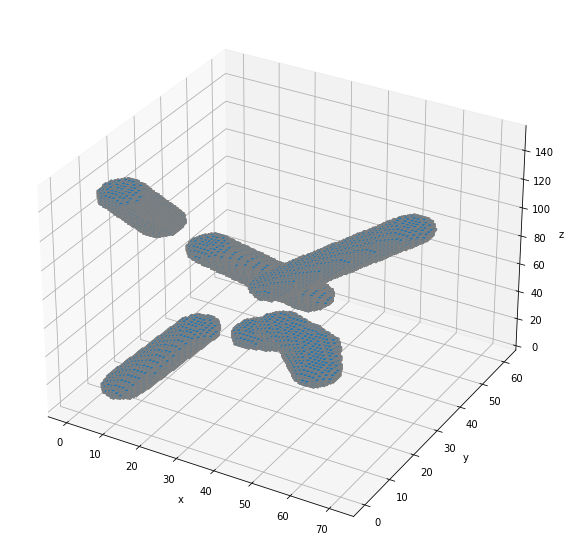

CPU times: user 37 s, sys: 586 ms, total: 37.6 s
Wall time: 36.8 s


In [75]:
%%time
#from holopy.scattering.scatterer import Indicators
#indi = Indicators(lambda x: sph_rule(x, R=0.5, delta=1))
#copa_sph = Scatterer(indi, n=1.5, center=(1,1,0))

from mpl_toolkits.mplot3d import Axes3D
def make_ax(grid=False):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection='3d')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.grid(grid)
    return ax

filam = np.array(copa_fil.voxelate(spacing=0.002), dtype=bool)

#filled = np.zeros((filam[:,0].max()+1, filam[:,1].max()+1, filam[:,2].max()+1), dtype=bool)
#for c in filam:
#    filled[c[0],c[1],c[2]] = True

ax = make_ax(True)
ax.voxels(filam, edgecolors='gray', shade=False)
plt.show()

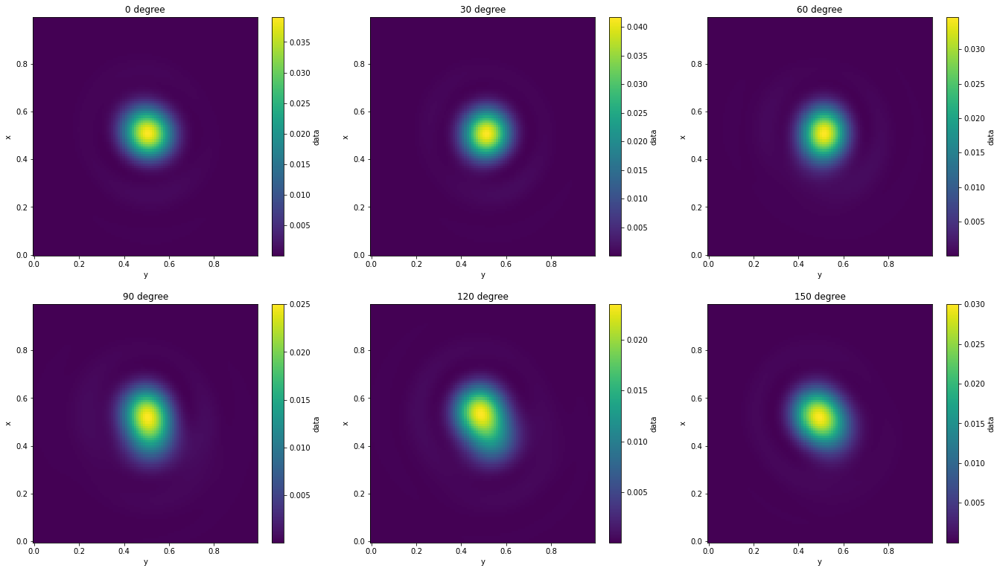

CPU times: user 22.5 s, sys: 1.5 s, total: 24 s
Wall time: 4min 10s


In [76]:
%%time
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(0.5,0.5,0))
detector = hp.detector_grid(100, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002))
holo_unp = calc_unpolar(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, theory=len_dda)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

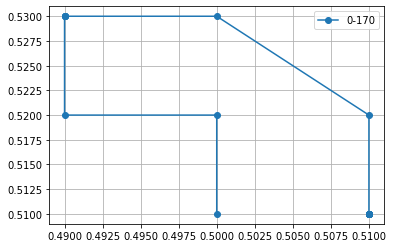

In [77]:
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    br_peak.append(np.unravel_index(np.argmax(holo_fil[th].values),(100,100)))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

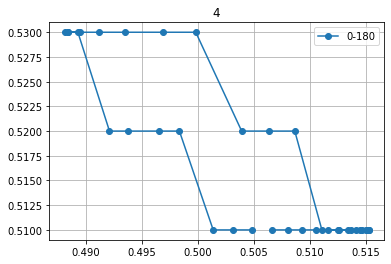

In [78]:
w = 4
br_peak = []
for th in np.linspace(0,180,36, endpoint=False):
    br_peak.append(bright_cen(apply_pol(holo_unp, th*np.pi/180).values, w=w))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:]*0.01, br_peak[0,:]*0.01, '-o', label='0-180')
plt.legend()
plt.grid()
plt.title(str(w))
plt.show()

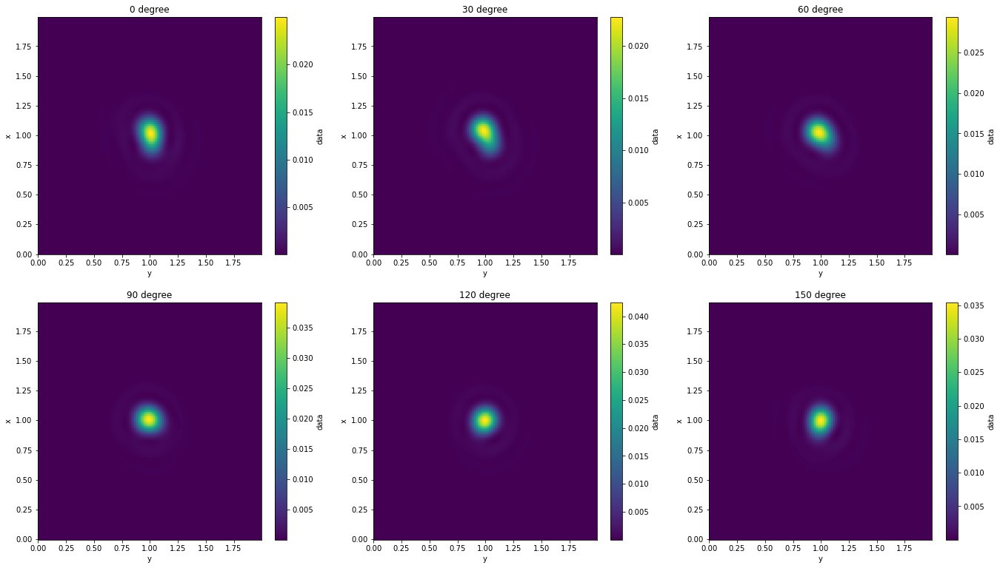

CPU times: user 5min 36s, sys: 10.6 s, total: 5min 46s
Wall time: 12min 48s


In [211]:
%%time
#copa_fil = Scatterer(indi, n=1.5658+1j*0.7444, center=(1,1,0))
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(1,1,0))
detector = hp.detector_grid(200, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

CPU times: user 22.1 ms, sys: 1.67 ms, total: 23.8 ms
Wall time: 23 ms


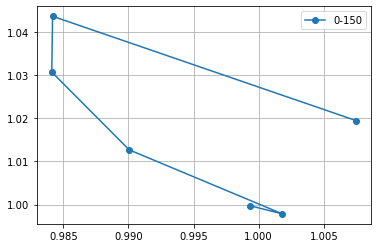

In [212]:
%%time
br_peak = []
for th in [0,30,60,90,120,150]:
    br_peak.append(bright_cen(holo_fil[th][...,0].values))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:]*0.01, br_peak[0,:]*0.01, '-o', label='0-150')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

#### Center-of-mass size

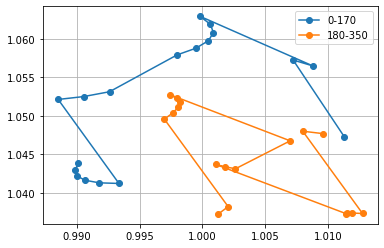

In [99]:
# w=12
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

CPU times: user 44.8 ms, sys: 57 µs, total: 44.9 ms
Wall time: 43.6 ms


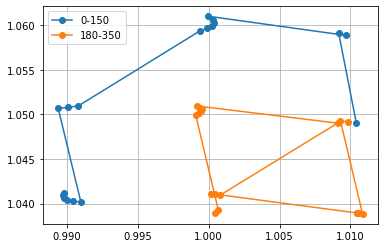

In [112]:
%%time
br_peak_s = []
for th in np.linspace(0,360,36, endpoint=False):
    br_peak_s.append(bright_cen(holo_fil[th][...,0].values, w=6))
br_peak_s = np.array(br_peak_s).T
plt.plot(br_peak_s[1,:-18]*0.01, br_peak_s[0,:-18]*0.01, '-o', label='0-150')
plt.plot(br_peak_s[1,-18:]*0.01, br_peak_s[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

CPU times: user 43.7 ms, sys: 37 µs, total: 43.7 ms
Wall time: 42.7 ms


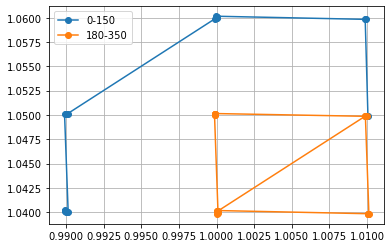

In [113]:
%%time
br_peak_s = []
for th in np.linspace(0,360,36, endpoint=False):
    br_peak_s.append(bright_cen(holo_fil[th][...,0].values, w=2))
br_peak_s = np.array(br_peak_s).T
plt.plot(br_peak_s[1,:-18]*0.01, br_peak_s[0,:-18]*0.01, '-o', label='0-150')
plt.plot(br_peak_s[1,-18:]*0.01, br_peak_s[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

### Center of 'mass' coordinates

In [10]:
def bright_cen(img, w=12):
    sh = img.shape
    peak = np.array(np.unravel_index(np.argmax(img),sh))
    peak[peak<w] = w
    bright = img[peak[0]-w:peak[0]+w+1,peak[1]-w:peak[1]+w+1]
    x,y = np.meshgrid(range(-w,w+1),range(-w,w+1))
    return peak[0]+np.sum(x*bright)/np.sum(bright), peak[1]+np.sum(y*bright)/np.sum(bright)

In [360]:
copa = np.arange(10)
copa[5-2:5+2+1]

array([3, 4, 5, 6, 7])

In [372]:
bright_cen(holo_fil[30][...,0].values)#.values.shape

(108.59277653617741, 96.34029372725507)

CPU times: user 30.9 ms, sys: 57 µs, total: 31 ms
Wall time: 29.4 ms


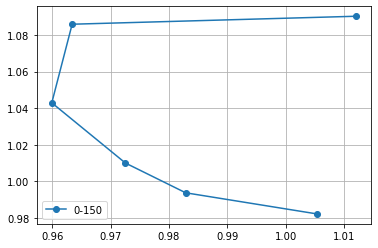

In [373]:
%%time
br_peak = []
for th in [0,30,60,90,120,150]:
    br_peak.append(bright_cen(holo_fil[th][...,0].values))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:]*0.01, br_peak[0,:]*0.01, '-o', label='0-150')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

In [ ]:
%%time
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    br_peak.append(np.unravel_index(np.argmax(holo_fil[th].values),(200,200)))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

## Barshift for a sphere

In [7]:
holo_fil = {}

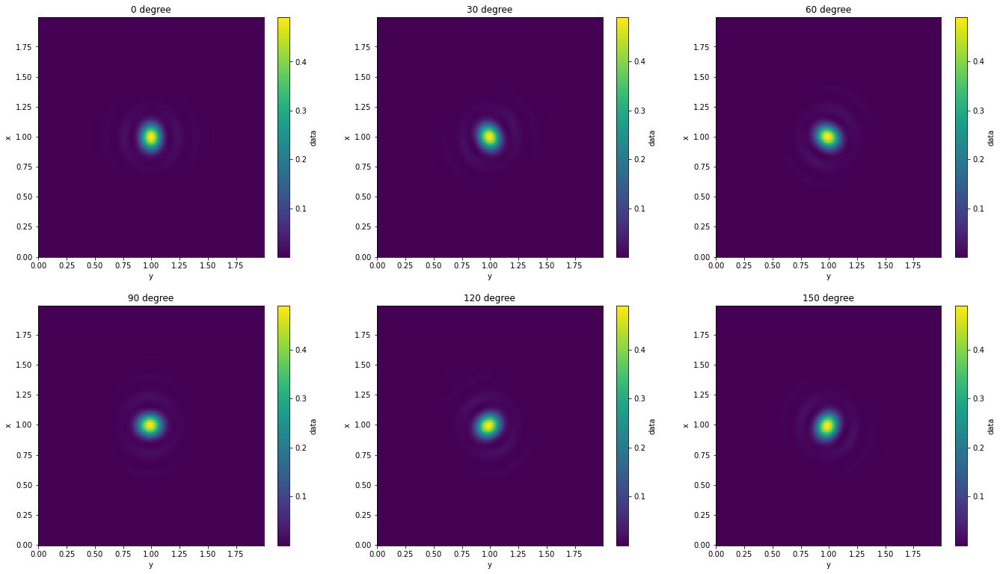

CPU times: user 5min 46s, sys: 10.7 s, total: 5min 57s
Wall time: 5min 7s


In [189]:
%%time
#from holopy.scattering.scatterer import Indicators
#indi = Indicators(lambda x: filament_rule(x, fil_coord, R=R), bound=fil_bounds)
copa_fil = Sphere(n=0.0345+1j*2.86, r=0.025, center=(1,1,0)) #Scatterer(indi, n=0.0345+1j*2.86, center=(1,1,0))
detector = hp.detector_grid(200, .01)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

CPU times: user 32min 41s, sys: 1min 3s, total: 33min 44s
Wall time: 9min 6s


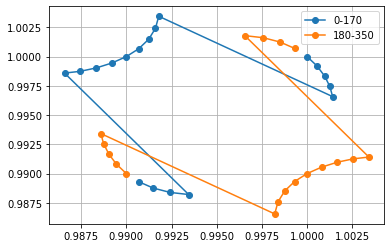

In [13]:
%%time
copa_fil = Sphere(n=0.0345+1j*2.86, r=0.025, center=(1,1,0))
detector = hp.detector_grid(200, .01)
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    br_peak.append(bright_cen(holo_fil[th][...,0].values))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

### Lens vs No Lens

CPU times: user 46min 54s, sys: 1min 16s, total: 48min 11s
Wall time: 19min 42s


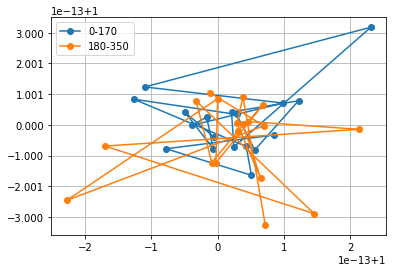

In [60]:
%%time
copa_fil = Sphere(n=0.0345+1j*2.86, r=0.025, center=(1,1,0))
detector = hp.detector_grid(200, .01)
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    len_dda = Lens(1.4, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1., illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    #holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    br_peak.append(bright_cen(holo_fil[th][...,0].values))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

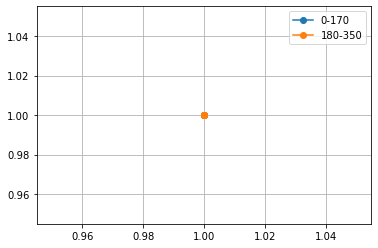

In [61]:
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    br_peak.append(np.unravel_index(np.argmax(holo_fil[th].values),(200,200)))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

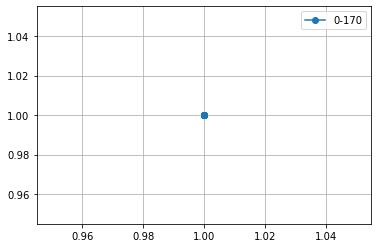

In [62]:
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
#plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

In [63]:
print(br_peak[1,:-18],'\n', br_peak[0,:-18])

[100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100] 
 [100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100]


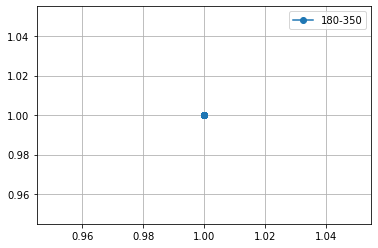

In [64]:
#plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

In [65]:
print(br_peak[1,-18:],'\n', br_peak[0,-18:])

[100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100] 
 [100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100]


In [59]:
#%%time
from holopy.scattering.theory import Mie, MieLens
s = Sphere(n=0.05+1j*2.1, r=0.025, center=(1,1,1.5))
detector = hp.detector_grid(200, .01)
len_dda = MieLens(1.4)#Lens(1.4, Mie())#DDA(use_gpu=True, max_dpl_size=0.002))
holo = calc_field(detector, s, medium_index=1.5, illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo = (np.abs(holo)**2).sum(dim='vector')
print('center with lens:', np.unravel_index(np.argmax(holo), (200,200)))

no_len_dda = Mie()#DDA(use_gpu=True, max_dpl_size=0.002)
holo = calc_field(detector, s, medium_index=1.5, illum_wavelen=0.4, illum_polarization=(1,0), theory=no_len_dda)
holo = (np.abs(holo)**2).sum(dim='vector')
print('center with no lens:', np.unravel_index(np.argmax(holo), (200,200)))

center with lens: (100, 100)
center with no lens: (100, 100)


CPU times: user 38.4 s, sys: 1.14 s, total: 39.6 s
Wall time: 5min 55s


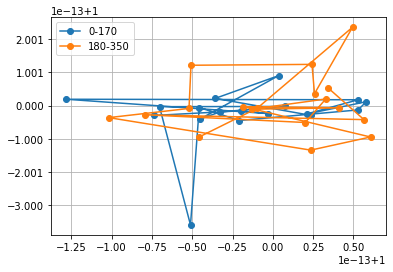

In [19]:
%%time
copa_fil = Sphere(n=0.0345+1j*2.86, r=0.025, center=(1,1,0.5))
detector = hp.detector_grid(200, .01)
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    no_len_dda = DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient',str(th),'0','0'])
    holo = calc_field(detector, copa_fil, medium_index=1., illum_wavelen=0.465, illum_polarization=(1,0), theory=no_len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    #holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    br_peak.append(bright_cen(holo_fil[th][...,0].values))
br_peak = np.around(np.array(br_peak).T, decimals=2)
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

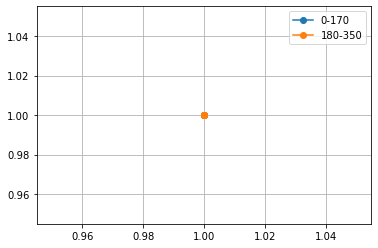

In [23]:
br_peak = np.around(br_peak, decimals=2)
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

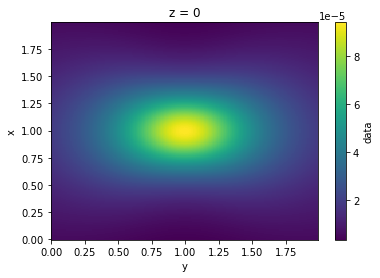

In [20]:
holo_fil[30].plot()

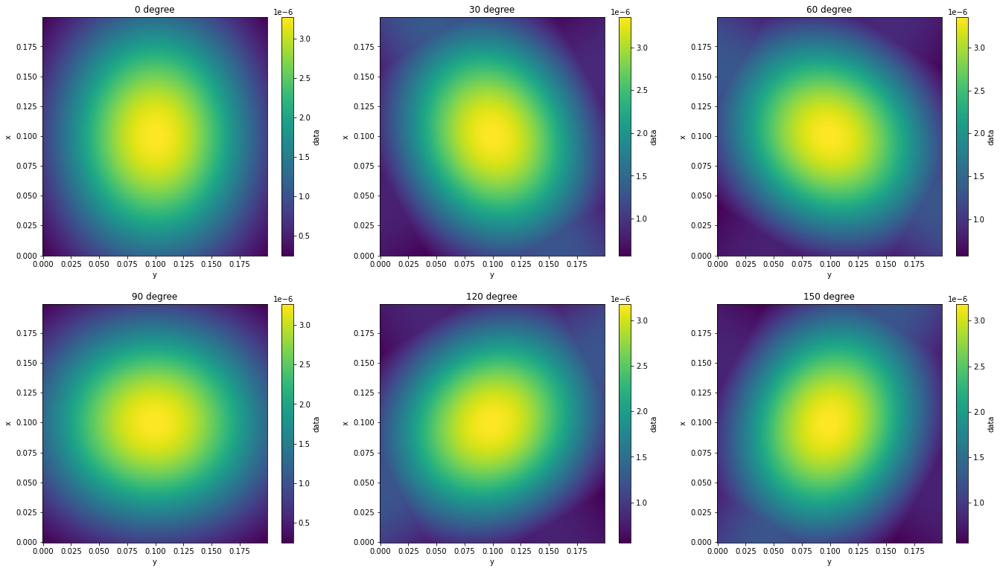

CPU times: user 5min 10s, sys: 10.7 s, total: 5min 20s
Wall time: 1min 6s


In [6]:
%%time
#from holopy.scattering.scatterer import Indicators
#indi = Indicators(lambda x: filament_rule(x, fil_coord, R=R), bound=fil_bounds)
copa_fil = Sphere(n=0.0345+1j*2.86, r=0.005, center=(0.1,0.1,0)) #Scatterer(indi, n=0.0345+1j*2.86, center=(1,1,0))
detector = hp.detector_grid(200, .001)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.001, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='edge', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

CPU times: user 30min 53s, sys: 1min 3s, total: 31min 56s
Wall time: 6min 29s


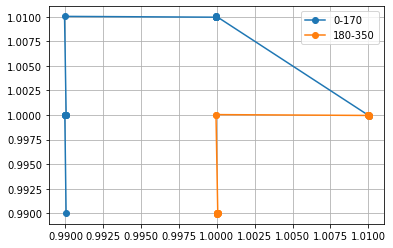

In [7]:
%%time
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.001, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, illum_polarization=(1,0), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='symmetric', order=3)
    br_peak.append(bright_cen(holo_fil[th][...,0].values))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

CPU times: user 56.4 ms, sys: 0 ns, total: 56.4 ms
Wall time: 55.7 ms


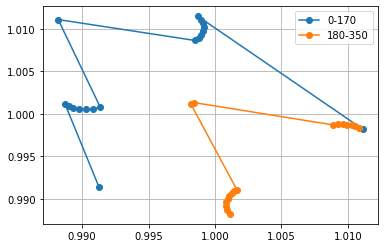

In [10]:
%%time
br_peak = []
for th in np.linspace(0,360,36, endpoint=False):
    br_peak.append(bright_cen(holo_fil[th][...,0].values, w=70))
br_peak = np.array(br_peak).T
plt.plot(br_peak[1,:-18]*0.01, br_peak[0,:-18]*0.01, '-o', label='0-170')
plt.plot(br_peak[1,-18:]*0.01, br_peak[0,-18:]*0.01, '-o', label='180-350')
plt.legend()
plt.grid()

In [5]:
from holopy.scattering.tests.test_lens import *

# We test that rotating the lab frame correctly rotates
# the polarization.
# If we rotate (x0, y0) -> (y1, -x1), then the polarization
# in the new coordinates should be
# E1x = E0y, E1y = -E1x
scatterer = test_common.sphere
medium_wavevec = 2 * np.pi / test_common.wavelen
medium_index = test_common.index
theory = Lens(
            lens_angle=LENS_ANGLE,
            theory=Mie(False, False),
            quad_npts_theta=200,
            quad_npts_phi=200,
            )

krho = np.linspace(0, 100, 11)
phi_0 = 0 * krho
phi_1 = np.full_like(krho, -np.pi / 2)
kz = np.full_like(krho, 20.0)

pol_0 = xr.DataArray([1.0, 0, 0])
pos_0 = np.array([krho, phi_0, kz])

pol_1 = xr.DataArray([0, -1.0, 0])
pos_1 = np.array([krho, phi_1, kz])

args = (scatterer, medium_wavevec, medium_index)

fields_0 = theory._raw_fields(pos_0, *args, pol_0)
fields_1 = theory._raw_fields(pos_1, *args, pol_1)

tols = {'atol': 1e-5, 'rtol': 1e-5}
assert_allclose(fields_1[0],  fields_0[1], **tols)
assert_allclose(fields_1[1], -fields_0[0], **tols)

Text(0.5, 1.0, 'Difference; should be 0')

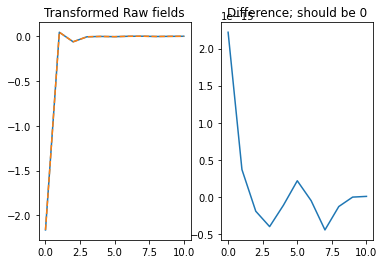

In [9]:
import matplotlib.pyplot as plt
f = plt.figure()
ax1 = f.add_subplot(1, 2, 1)
ax1.plot(fields_1[1].real); ax1.plot(-fields_0[0].real,'--'); ax1.set_title("Transformed Raw fields")
ax2 = f.add_subplot(1, 2, 2)
ax2.plot(fields_1[1].real + fields_0[0].real); ax2.set_title("Difference; should be 0")

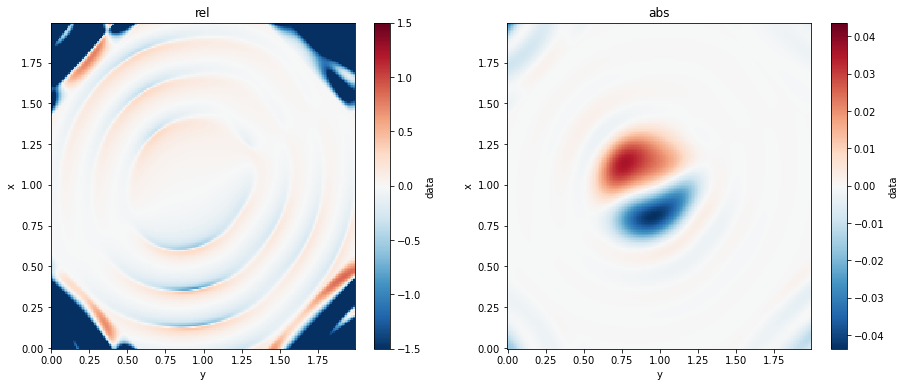

CPU times: user 2min 25s, sys: 4.32 s, total: 2min 29s
Wall time: 35.9 s


In [23]:
%%time
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 45*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
#holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = -45
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
hol_np = (holo.values)[...,0]
for i,row in enumerate(hol_np):
    for j,elem in enumerate(row):
        hol_np[i,j] = min(elem, 1.5)
        hol_np[i,j] = max(elem, -1.5)
holo[...,0] = hol_np
holo.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

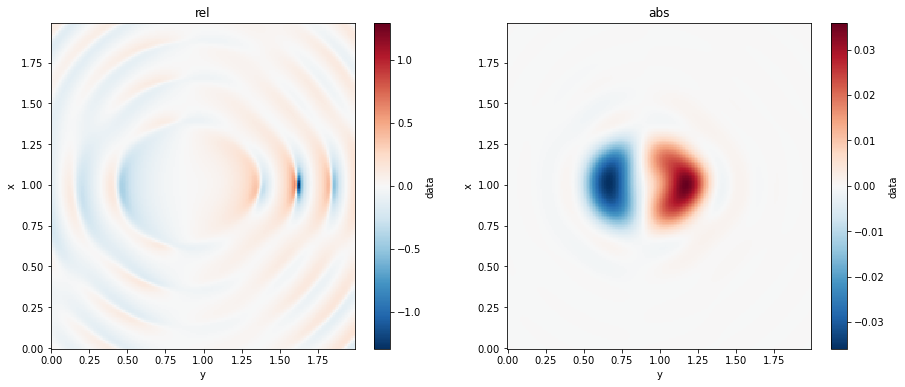

CPU times: user 2min 26s, sys: 3.69 s, total: 2min 30s
Wall time: 35.5 s


In [17]:
%%time
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 90*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
#holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = 90
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
hol_np = (holo.values)[...,0]
for i,row in enumerate(hol_np):
    for j,elem in enumerate(row):
        hol_np[i,j] = min(elem, 1.5)
        hol_np[i,j] = max(elem, -1.5)
holo[...,0] = hol_np
holo.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

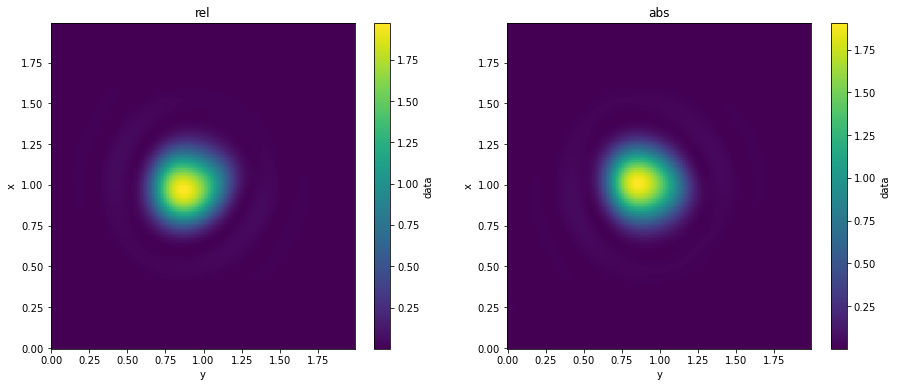

CPU times: user 2min 24s, sys: 3.95 s, total: 2min 28s
Wall time: 35.3 s


In [20]:
%%time
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 30*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
#holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = 30
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
holo45.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo225.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

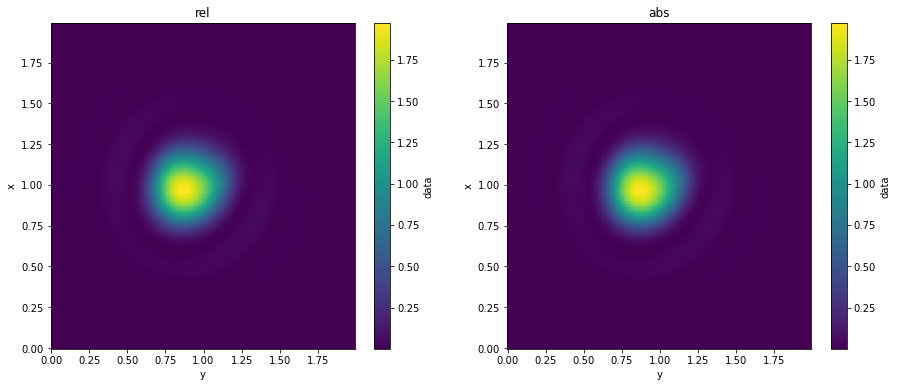

CPU times: user 2min 25s, sys: 3.89 s, total: 2min 29s
Wall time: 35.4 s


In [21]:
%%time
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 30*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
#holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = -30
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
holo45.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo225.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

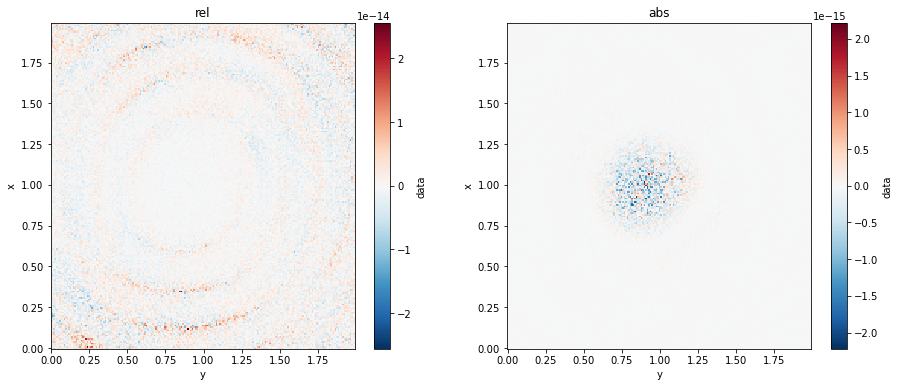

In [25]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 45*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
#holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = 225*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
#holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
holo.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

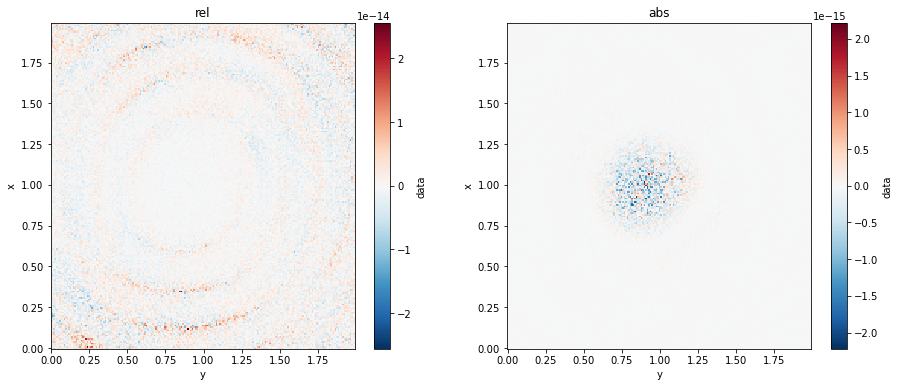

In [25]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 45*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
#holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = 225*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
#holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
holo.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

#### Ez check

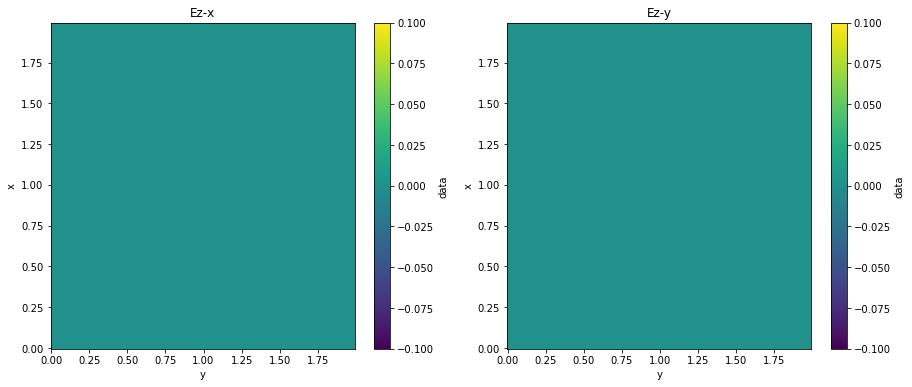

In [34]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 0*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo45 = np.abs(holo.sel(vector='z')) #(np.abs(holo)**2).sum(dim='vector')
#holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = 90*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo225 = np.abs(holo.sel(vector='z')) #(np.abs(holo)**2).sum(dim='vector')
#holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = holo45#(holo45-holo225)/holo45
holo.plot(ax=axes[0])
axes[0].set_title('Ez-x')
holo = holo225#(holo45-holo225)
holo.plot(ax=axes[1])
axes[1].set_title('Ez-y')
plt.show()

#### Old rotation-based 180degr period CHECK

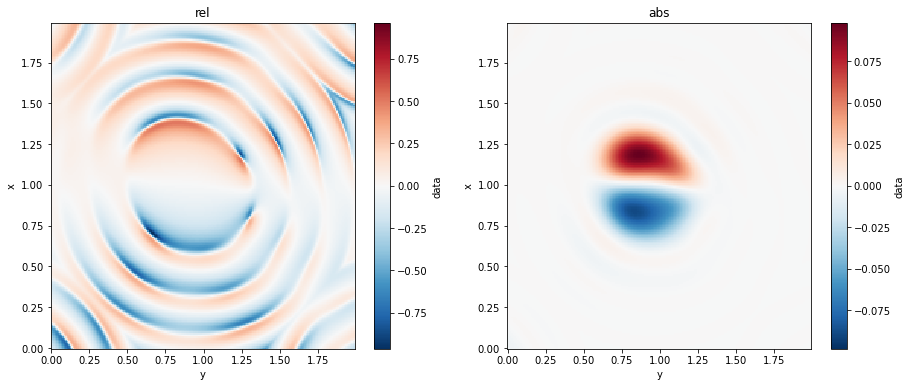

In [11]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 45
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = 225
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
holo.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

In [33]:
import h5py
with h5py.File('../../../../70nm/data/data_raw_root_ims_9pol_80.h5','r') as df:
    print(df.keys())
    for k in df['Carbon'].keys():
        for d in df['Carbon/'+k].keys():
            count = 0
            for p in df['Carbon/'+k+'/'+d].keys():
                count += df['Carbon/'+k+'/'+d+'/'+p+'/images'].shape[0]
            print('Carbon/'+k+'/'+d, count)
        print()
    
    count = 0
    for s in df['fog'].keys():
        for p in df['fog/'+s].keys():
            count += df['fog/'+s+'/'+p+'/images'].shape[0]
    print('fog',count,'\n')
    
    for o in df['gamma'].keys():
        count = 0
        for p in df['gamma/'+o].keys():
            count += df['gamma/'+o+'/'+p+'/images'].shape[0]
        print('gamma/'+o, count)

<KeysViewHDF5 ['Carbon', 'fog', 'gamma', 'test_sample_2020']>
Carbon/100keV/0degr 46292
Carbon/100keV/45degr 58702
Carbon/100keV/90degr 58957
Carbon/100keV/test 72046

Carbon/30keV/0degr 74910
Carbon/30keV/45degr 75047
Carbon/30keV/90degr 73688
Carbon/30keV/test 97886

Carbon/60keV/0degr 91852
Carbon/60keV/45degr 75935
Carbon/60keV/90degr 78398
Carbon/60keV/test 109518

fog 178033 

gamma/nomark 82118
gamma/opmark 70585
gamma/opmark_med 41667


## Two Spheres Ag

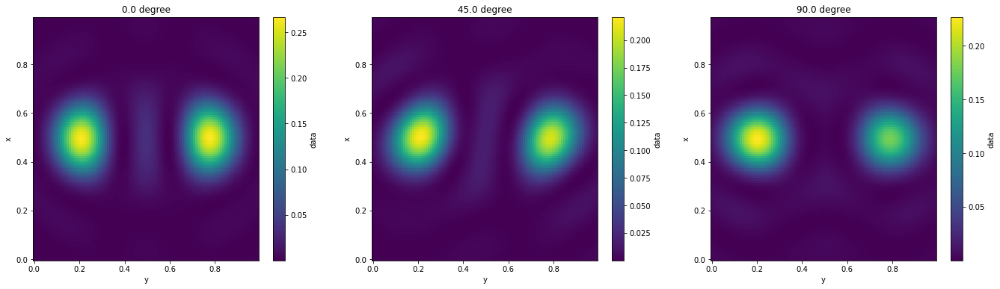

In [19]:
s1 = Sphere(r = 0.05, center = (0, -0.3, 0))
s2 = Sphere(r = 0.05, center = (0, 0.3, 0))
detector = hp.detector_grid(100, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

fig, axes = plt.subplots(1, 3, figsize=(23, 6))
axes = np.ravel(axes)
for i,th in enumerate([0,45,90]):
    th *= np.pi/180
    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo.plot(ax=axes[i])
    axes[i].set_title(str(np.around(th*180/np.pi))+' degree')
plt.show()

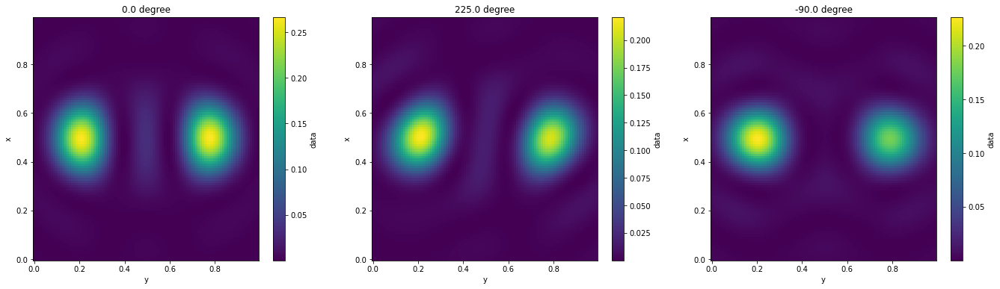

In [22]:
s1 = Sphere(r = 0.05, center = (0, -0.3, 0))
s2 = Sphere(r = 0.05, center = (0, 0.3, 0))
detector = hp.detector_grid(100, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

fig, axes = plt.subplots(1, 3, figsize=(23, 6))
axes = np.ravel(axes)
for i,th in enumerate([0,225,-90]):
    th *= np.pi/180
    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo.plot(ax=axes[i])
    axes[i].set_title(str(np.around(th*180/np.pi))+' degree')
plt.show()

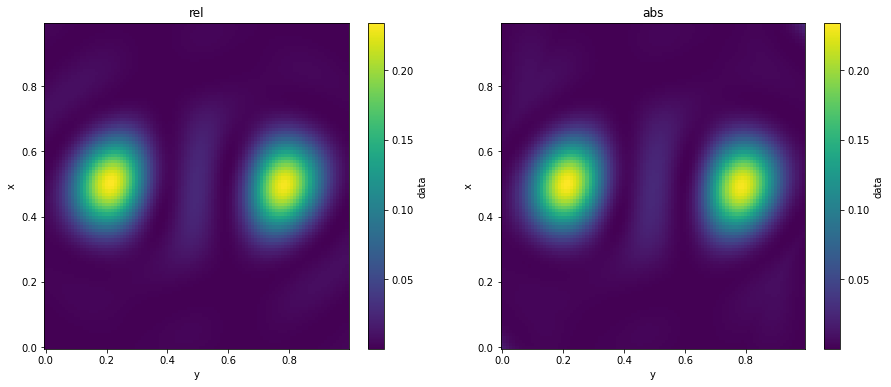

CPU times: user 37.3 s, sys: 998 ms, total: 38.3 s
Wall time: 11.4 s


In [24]:
%%time
s1 = Sphere(r = 0.05, center = (0, -0.3, 0))
s2 = Sphere(r = 0.05, center = (0, 0.3, 0))
detector = hp.detector_grid(100, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

th = 30*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)
holo45 = (np.abs(holo)**2).sum(dim='vector')
#holo45[...,0] = skimage.transform.rotate(holo45[...,0], angle=-1*th, mode='symmetric', order=3)

th = -30
len_dda = Lens(1.38, DDA(use_gpu=True, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo225 = (np.abs(holo)**2).sum(dim='vector')
holo225[...,0] = skimage.transform.rotate(holo225[...,0], angle=-1*th, mode='symmetric', order=3)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
holo = (holo45-holo225)/holo45
holo45.plot(ax=axes[0])
axes[0].set_title('rel')
holo = (holo45-holo225)
holo225.plot(ax=axes[1])
axes[1].set_title('abs')
plt.show()

## Brightness peak

In [179]:
Ag_n = np.loadtxt('Ag_wu14.txt')
lamb_min = Ag_n[0,0]; lamb_max = Ag_n[-1,0]
m_ag = {}
m_ag['R'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,1], kind='cubic')
m_ag['I'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,2], kind='cubic')
#mask = (ag_n[:,0]>0.35) & (ag_n[:,0]<0.65)
#ag_mask = ag_n[mask]

In [180]:
peak_sph = {}

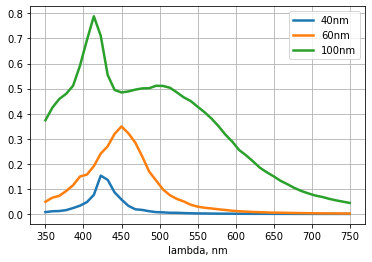

CPU times: user 31min 49s, sys: 1min 7s, total: 32min 57s
Wall time: 1h 2min 51s


In [181]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
for d in [40,60,100]:
    len_dda = Lens(1.38, DDA(max_dpl_size=0.002, use_gpu=True))
    detector = hp.detector_grid(100, .01)

    peak_sph[str(d)] = []
    for lam in np.linspace(0.35,0.75,45):
        s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
        holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
        holo = (np.abs(holo)**2).sum(dim='vector')
        peak_sph[str(d)].append(holo.max())
    plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm', linewidth=2.5)
plt.legend()
plt.xlabel('lambda, nm')
plt.grid()
plt.show()

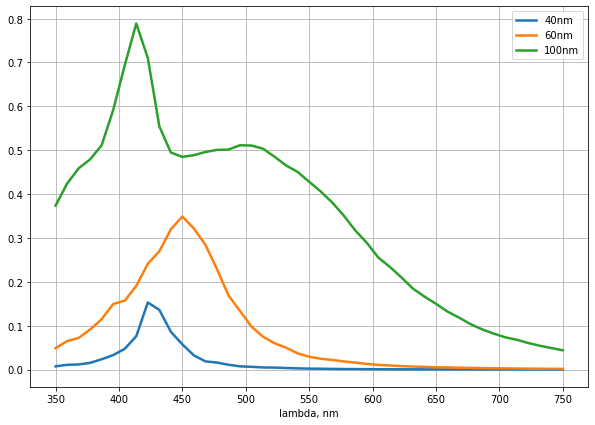

In [188]:
plt.figure(figsize=(10,7))
for d in [40,60,100]:
    plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm', linewidth=2.5)
plt.legend()
plt.xlabel('lambda, nm')
plt.grid()
plt.show()

# UNPOLARISED light

In [47]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

th = 0*np.pi/180
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(np.cos(th), np.sin(th)), theory=len_dda)

In [76]:
copa = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
copa.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
copa.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
copa.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
copa.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))

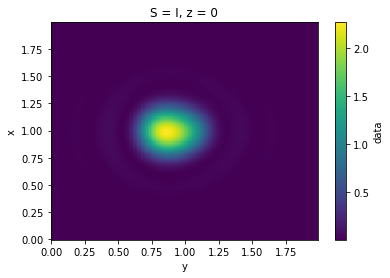

In [77]:
copa.sel(S='I').plot()

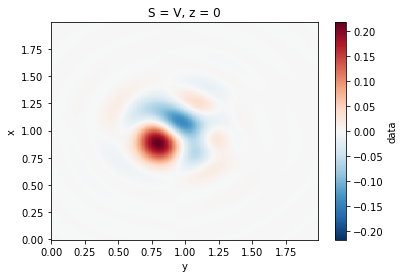

In [80]:
copa.sel(S='V').plot()

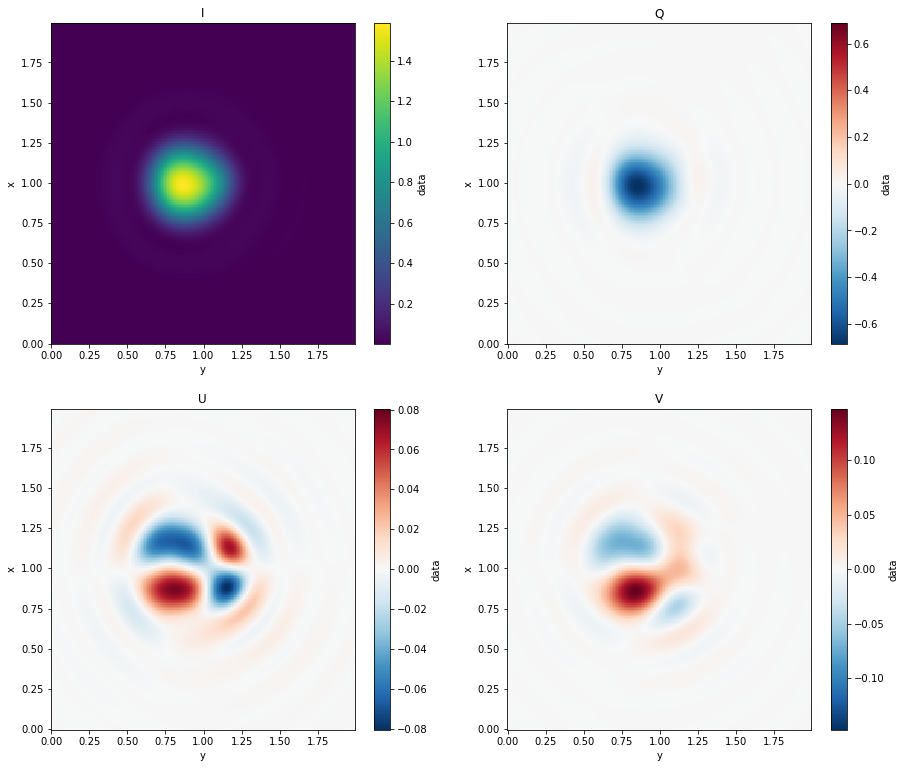

In [81]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA())

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

# X
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo_x = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
holo_x.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
holo_x.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
holo_x.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
holo_x.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))


# Y
len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(0,1), theory=len_dda)
holo_y = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
holo_y.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
holo_y.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
holo_y.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
holo_y.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))

fig, axes = plt.subplots(2, 2, figsize=(15, 13))
axes = np.ravel(axes)
holo_unp = (holo_x + holo_y)/2
holo_unp.sel(S='I').plot(ax=axes[0])
axes[0].set_title('I')
holo_unp.sel(S='Q').plot(ax=axes[1])
axes[1].set_title('Q')
holo_unp.sel(S='U').plot(ax=axes[2])
axes[2].set_title('U')
holo_unp.sel(S='V').plot(ax=axes[3])
axes[3].set_title('V')
plt.show()

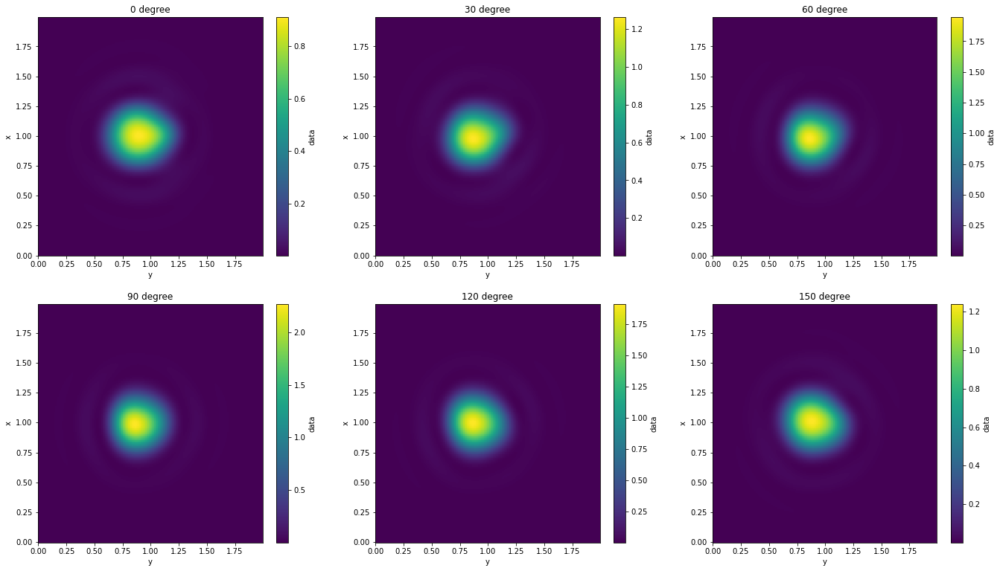

In [91]:
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    th *= np.pi/180
    holo_th = 0.5*(holo_unp.sel(S='I') + holo_unp.sel(S='Q')*np.cos(2*th) + holo_unp.sel(S='U')*np.sin(2*th))*2 ###
    holo_th.plot(ax=axes[i])
    axes[i].set_title(str(round(th*180/np.pi))+' degree')
plt.show()

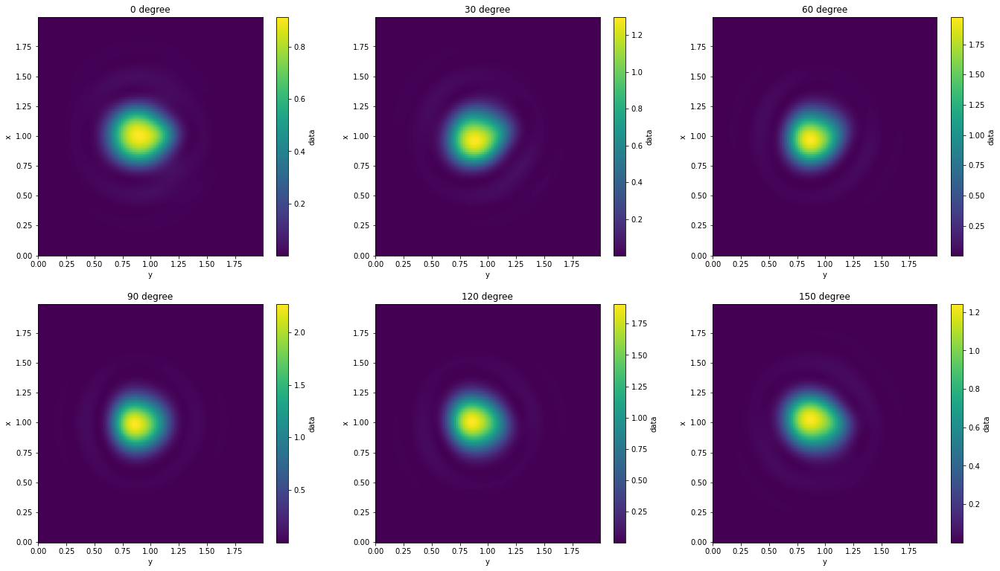

CPU times: user 5min 26s, sys: 11.1 s, total: 5min 37s
Wall time: 1min 18s


In [90]:
%%time
holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, biel, medium_index=1.515, illum_wavelen=0.4, illum_polarization=(np.sin(th), np.cos(th)), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    #holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='edge', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(round(th*180/np.pi))+' degree')
plt.show()

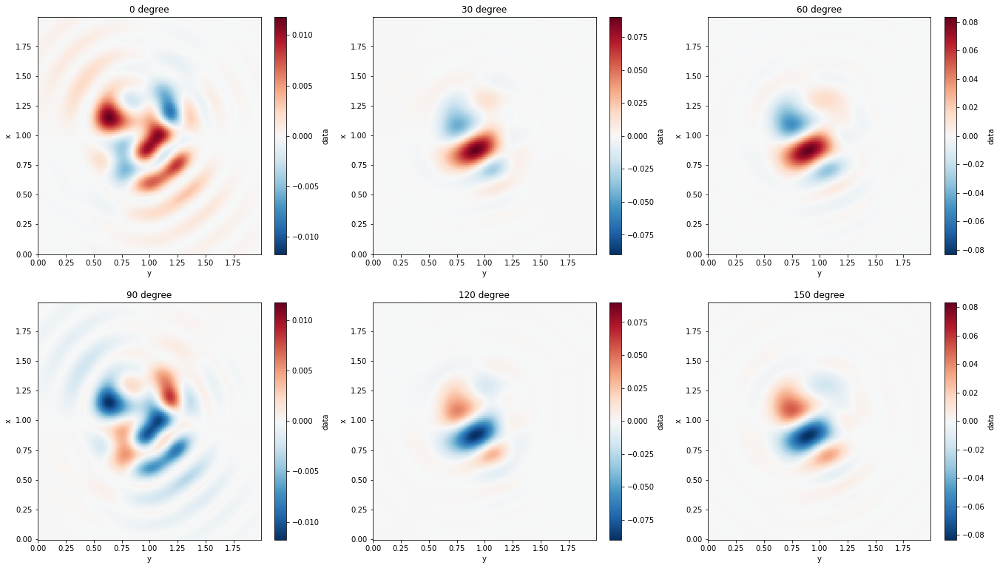

In [92]:
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    th *= np.pi/180
    holo_th = holo_fil[th] - (holo_unp.sel(S='I') + holo_unp.sel(S='Q')*np.cos(2*th) + holo_unp.sel(S='U')*np.sin(2*th)) ###
    holo_th.plot(ax=axes[i])
    axes[i].set_title(str(round(th*180/np.pi))+' degree')
plt.show()

# REFLECTED light

### two ellipsoids

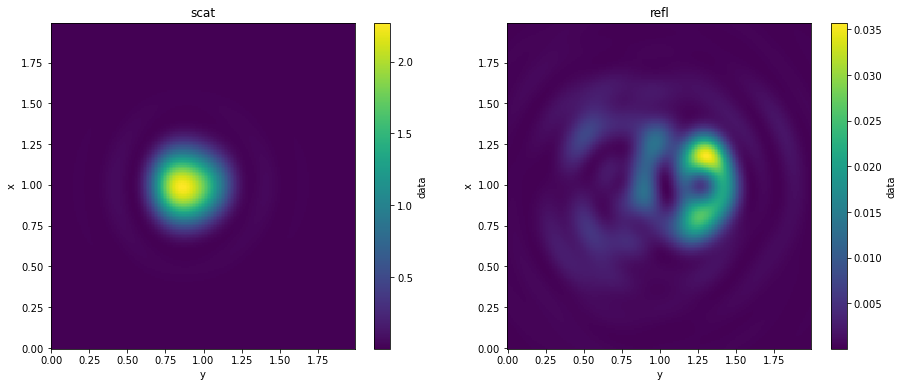

In [4]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA(), refl_light=True)

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

# X
len_dda = Lens(1.38, DDA(use_gpu=True), refl_light=False)#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo_x = (np.abs(holo)**2).sum(dim='vector')

# Y
len_dda = Lens(1.38, DDA(use_gpu=True), refl_light=True)#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, biel, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo_y = (np.abs(holo)**2).sum(dim='vector')

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
#holo_unp = (holo_x + holo_y)/2
holo_x.plot(ax=axes[0])
axes[0].set_title('scat')
holo_y.plot(ax=axes[1])
axes[1].set_title('refl')
plt.show()

### two spheres

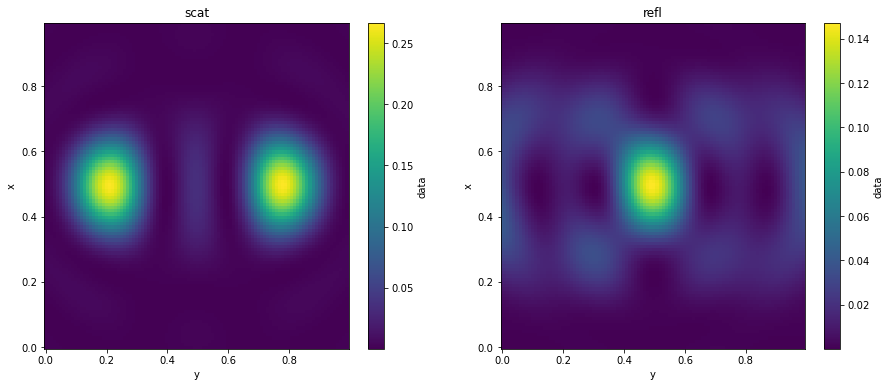

In [4]:
s1 = Sphere(r = 0.05, center = (0, -0.3, 0))
s2 = Sphere(r = 0.05, center = (0, 0.3, 0))
detector = hp.detector_grid(100, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

# X
len_dda = Lens(1.38, DDA(use_gpu=True), refl_light=False)#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo_x = (np.abs(holo)**2).sum(dim='vector')

# Y
len_dda = Lens(1.38, DDA(use_gpu=True), refl_light=True)#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo_y = (np.abs(holo)**2).sum(dim='vector')

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
#holo_unp = (holo_x + holo_y)/2
holo_x.plot(ax=axes[0])
axes[0].set_title('scat')
holo_y.plot(ax=axes[1])
axes[1].set_title('refl')
plt.show()

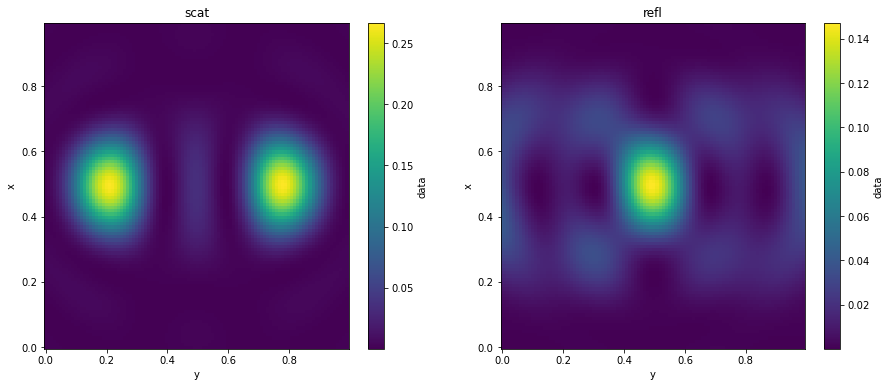

In [6]:
s1 = Sphere(r = 0.05, center = (0, -0.3, 0))
s2 = Sphere(r = 0.05, center = (0, 0.3, 0))
detector = hp.detector_grid(100, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

# X
len_dda = Lens(1.38, DDA(use_gpu=True), refl_light=False)#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo_x = (np.abs(holo)**2).sum(dim='vector')

# Y
len_dda = Lens(1.38, DDA(use_gpu=True), refl_light=True)#, addacmd=['-orient',str(th),'0','0']))
holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
holo_y = (np.abs(holo)**2).sum(dim='vector')

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
#holo_unp = (holo_x + holo_y)/2
holo_x.plot(ax=axes[0])
axes[0].set_title('scat')
holo_y.plot(ax=axes[1])
axes[1].set_title('refl')
plt.show()

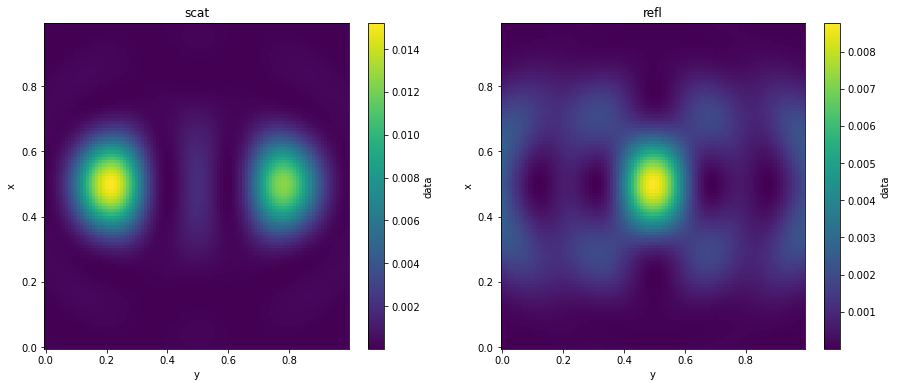

In [8]:
s1 = Sphere(r = 0.025, center = (0, -0.3, 0))
s2 = Sphere(r = 0.025, center = (0, 0.3, 0))
detector = hp.detector_grid(100, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
for refl in [False, True]:
    len_dda = Lens(1.38, DDA(use_gpu=True), refl_light=refl)
    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo.plot(ax=axes[int(refl)])
    axes[int(refl)].set_title('refl' if refl else 'scat')
plt.show()

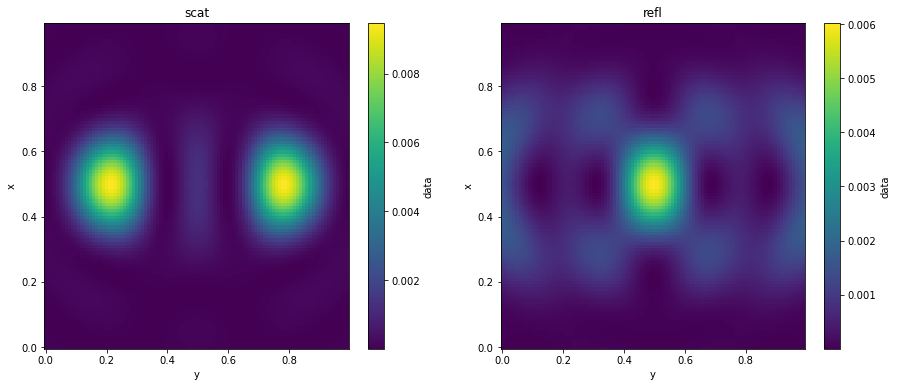

In [10]:
s1 = Sphere(r = 0.025, center = (0, -0.3, 0))
s2 = Sphere(r = 0.025, center = (0, 0.3, 0))
detector = hp.detector_grid(100, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (0.5, 0.5, 0))
len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
for refl in [False, True]:
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002), refl_light=refl)
    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo.plot(ax=axes[int(refl)])
    axes[int(refl)].set_title('refl' if refl else 'scat')
plt.show()

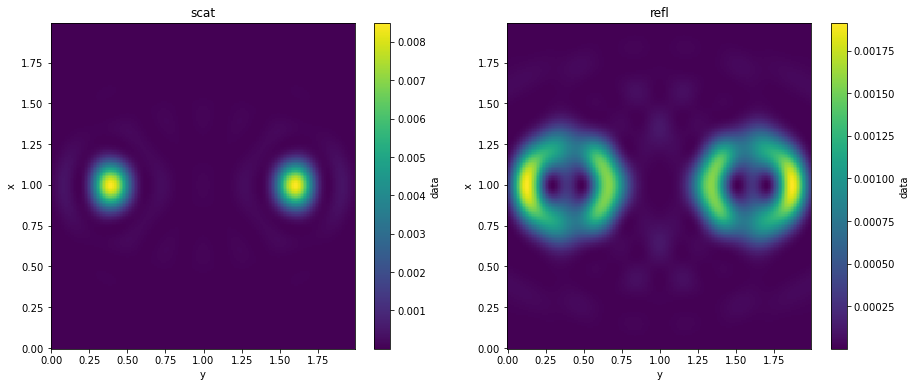

In [6]:
s1 = Sphere(r = 0.025, center = (0, -0.6, 0))
s2 = Sphere(r = 0.025, center = (0, 0.6, 0))
detector = hp.detector_grid(200, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
for refl in [False, True]:
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002), refl_light=refl)
    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo.plot(ax=axes[int(refl)])
    axes[int(refl)].set_title('refl' if refl else 'scat')
plt.show()

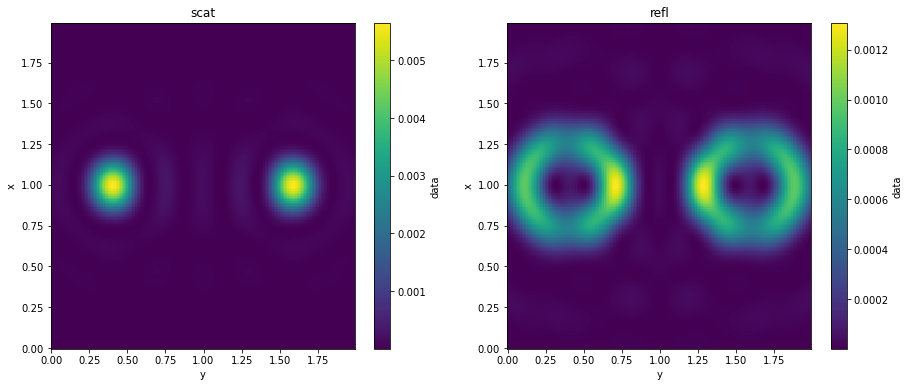

In [10]:
s1 = Sphere(r = 0.025, center = (0, -0.6, 0))
s2 = Sphere(r = 0.025, center = (0, 0.6, 0))
detector = hp.detector_grid(200, .01)
bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))
#len_dda = Lens(1.38, DDA(use_gpu=True))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(bisph.bounds)
c = bisph.center
for i,b in enumerate(bond):
    bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
    bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
bisph.indicators.bound = bond

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
for refl in [False, True]:
    len_dda = Lens(1.1, DDA(use_gpu=True, max_dpl_size=0.002), refl_light=refl)
    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo.plot(ax=axes[int(refl)])
    axes[int(refl)].set_title('refl' if refl else 'scat')
plt.show()

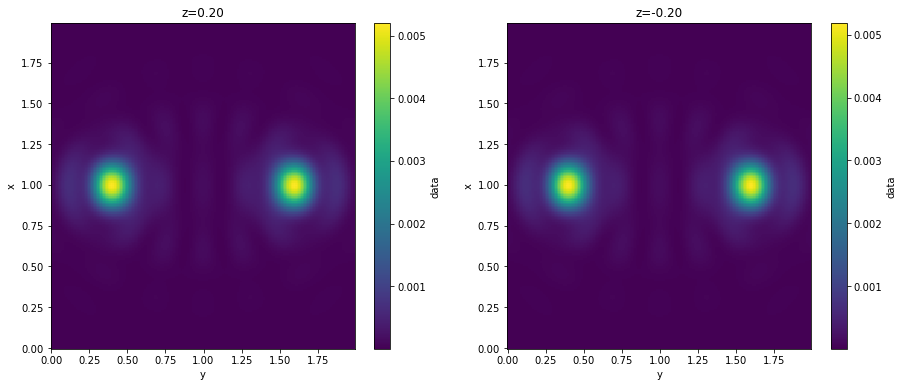

In [11]:
s1 = Sphere(r = 0.025, center = (0, -0.6, 0))
s2 = Sphere(r = 0.025, center = (0, 0.6, 0))
detector = hp.detector_grid(200, .01)
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
for refl in [False, True]:
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002), refl_light=False)
    bisph = Scatterer(lambda point: np.logical_or(s1.contains(point), s2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0.2*(1-refl*2)))

    # changing bounds by hand, since there is nothing in the center
    # and default algorithm will fail
    bond = np.array(bisph.bounds)
    c = bisph.center
    for i,b in enumerate(bond):
        bond[i,0] = min(s1.bounds[i][0], s2.bounds[i][0])
        bond[i,1] = max(s1.bounds[i][1], s2.bounds[i][1])
    bisph.indicators.bound = bond


    holo = calc_field(detector, bisph, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo.plot(ax=axes[int(refl)])
    axes[int(refl)].set_title('z={:.2f}'.format(0.2*(1-refl*2)))
plt.show()

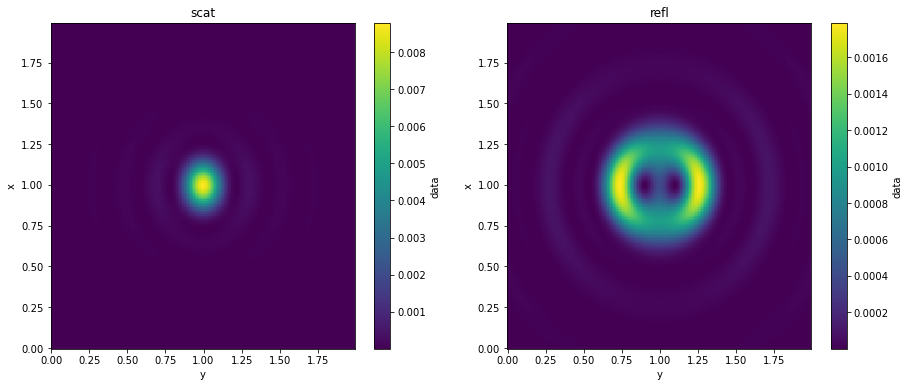

In [3]:
s = Sphere(r = 0.025, center = (1, 1, 0), n = 0.05+1j*2.1)
detector = hp.detector_grid(200, .01)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes = np.ravel(axes)
for refl in [False, True]:
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002), refl_light=refl)
    holo = calc_field(detector, s, medium_index=1., illum_wavelen=0.4, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    holo.plot(ax=axes[int(refl)])
    axes[int(refl)].set_title('refl' if refl else 'scat')
plt.show()

## Brian Leahy SOLUTION

In [6]:
import numpy as np
from holopy.scattering.theory.scatteringtheory import ScatteringTheory

class Backscattered(ScatteringTheory):
    def __init__(self, theory):
        self.theory = theory

    def _can_handle(self, scatterer):
        return self.theory._can_handle(scatterer)

    def _raw_scat_matrs(self, scatterer, pos, medium_wavevec, medium_index):
        r, theta, phi = pos
        theta_backscattered = np.pi - theta
        pos_backscattered = np.array([r, theta_backscattered, phi])

        args = (scatterer, pos_backscattered, medium_wavevec, medium_index)
        scat_matrices = np.array(self.theory._raw_scat_matrs(*args))

        # account for coordinate change in decomposition of incoming
        # light into theta, phi components:
        scat_matrices[:, 0, 0] *= -1
        scat_matrices[:, 0, 1] *= -1  # FIXME is it this or the transpose? NOW IT IS

        return scat_matrices

In [7]:
import holopy as hp
from holopy.scattering.interface import calc_intensity
from holopy.scattering import Sphere
from holopy.scattering.theory import Lens, Mie

import matplotlib.pyplot as plt; plt.close('all')

from holopy.scattering.theory.backscatter import Backscattered


THEORIES = {
    'normal': Lens(1.38,  Mie()),
    'backscattered': Lens(1.38, Backscattered(Mie()))}


def get_rayleigh_intensity(theory):
    scatterer = Sphere(r=0.05, center=(0.5, 0.5, 0), n=1.01)
    detector = hp.detector_grid(100, .01)
    kwargs = {
        'medium_index': 1.0, 'illum_wavelen': 0.4, 'illum_polarization': (1, 0)}
    return calc_intensity(detector, scatterer, theory=theory, **kwargs)


def make_unscaled_comparison():
    f = plt.figure()
    for i, name in enumerate(THEORIES):
        intensity = get_rayleigh_intensity(THEORIES[name])
        ax = f.add_subplot(1, 2, i + 1)
        ax.imshow(
            intensity.values.squeeze(),
            interpolation='bicubic',
            vmin=0,
            cmap='inferno')
        ax.set_title("Rayleigh scatterer,\nin focus, {}".format(name))
        
        
def make_scaled_comparison():
    f = plt.figure()
    for i, name in enumerate(THEORIES):
        intensity = get_rayleigh_intensity(THEORIES[name])
        ax = f.add_subplot(1, 2, i + 1)
        ax.imshow(
            intensity.values.squeeze(),
            interpolation='bicubic',
            vmin=0,
            vmax=2.44e-6,
            cmap='inferno')
        ax.set_title("Rayleigh scatterer,\nin focus, {}".format(name))

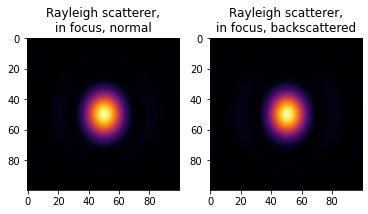

In [8]:
make_unscaled_comparison()

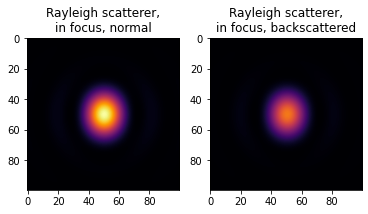

In [3]:
make_scaled_comparison()

# CUBE

In [3]:
def sph_rule(coord,R=1,delta=1):
    return np.sum((coord*delta)**2, axis=-1)<R**2


def line_rule(coord, p1=None, p2=None, delta=1.0, R=20):
    p = coord*delta
    l = p-p1; l12 = p2-p1
    d1 = -np.dot(p2-p1,p1); d2 = -np.dot(p2-p1, p2)
    return ((np.linalg.norm(np.cross(l,l12), axis=-1)/np.linalg.norm(l12, axis=-1)<R) * (np.dot(p,l12)+d2<0) * (np.dot(p,l12)+d1>0)) + (np.linalg.norm(l, axis=-1)<R) + (np.linalg.norm(p-p2, axis=-1)<R)# + (np.linalg.norm(l, axis=-1)<delta)

def filament_rule(coord, fil_coord, R=1):
    fill = np.zeros(coord.shape[:-1], dtype=bool)
    for i in range(fil_coord.shape[0]-1): 
        fill += line_rule(coord, p1=fil_coord[i], p2=fil_coord[i+1], delta=1, R=R)
    return fill

def cube_rule(coord, bounds):
#     x_b, y_b, z_b = bounds
    return (coord[...,0]>bounds[0][0])*(coord[...,0]<bounds[0][1])*(coord[...,1]>bounds[1][0])*(coord[...,1]<bounds[1][1])*(coord[...,2]>bounds[2][0])*(coord[...,2]<bounds[2][1])


In [4]:
def bright_cen(img, w=4):
    sh = img.shape
    peak = np.array(np.unravel_index(np.argmax(img),sh))
    peak[peak<w] = w
    bright = img[peak[0]-w:peak[0]+w+1,peak[1]-w:peak[1]+w+1]
    x,y = np.meshgrid(range(-w,w+1),range(-w,w+1))
    return peak[0]+np.sum(x*bright)/np.sum(bright), peak[1]+np.sum(y*bright)/np.sum(bright)

In [5]:
def calc_unpolar(detector, scat, medium_index=1., illum_wavelen=0.4, theory=None):
    # X
    holo = calc_field(detector, scat, medium_index=medium_index, illum_wavelen=illum_wavelen, illum_polarization=(1,0), theory=theory)
    holo_x = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
    holo_x.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
    holo_x.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
    holo_x.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
    holo_x.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))


    # Y
    holo = calc_field(detector, scat, medium_index=medium_index, illum_wavelen=illum_wavelen, illum_polarization=(0,1), theory=theory)
    holo_y = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
    holo_y.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
    holo_y.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
    holo_y.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
    holo_y.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))
    return (holo_x + holo_y)/2

In [6]:
def apply_pol(holo_un, th):
    return holo_un.sel(S='I') + holo_un.sel(S='Q')*np.cos(2*th) + holo_un.sel(S='U')*np.sin(2*th)

In [7]:
import numpy as np
from holopy.scattering.theory.scatteringtheory import ScatteringTheory

class Backscattered(ScatteringTheory):
    def __init__(self, theory):
        self.theory = theory

    def _can_handle(self, scatterer):
        return self.theory._can_handle(scatterer)

    def _raw_scat_matrs(self, scatterer, pos, medium_wavevec, medium_index):
        r, theta, phi = pos
        theta_backscattered = np.pi - theta
        pos_backscattered = np.array([r, theta_backscattered, phi])

        args = (scatterer, pos_backscattered, medium_wavevec, medium_index)
        scat_matrices = np.array(self.theory._raw_scat_matrs(*args))

        # account for coordinate change in decomposition of incoming
        # light into theta, phi components:
        scat_matrices[:, 0, 0] *= -1
        scat_matrices[:, 0, 1] *= -1  # FIXME is it this or the transpose? NOW IT IS

        return scat_matrices

In [8]:
R = 0.036
cube_center = [0,0,0]
cube_bounds = [[-R,R],[-R,R],[-R,R]]

# fil_coord = filaments[3].copy()

# for i in range(len(fil_coord)): fil_coord[i] = fil_coord[i][::-1]/1000

# for i in range(3): 
#     fil_bounds[i] = [min([f[:,i].min() for f in fil_coord])-R,max([f[:,i].max() for f in fil_coord])+R]
#     fil_center[i] = sum(fil_bounds[i])/2
#     for j in range(2): fil_bounds[i][j] -= fil_center[i]
# for i in range(len(fil_coord)): fil_coord[i] -= fil_center

from holopy.scattering.scatterer import Indicators
indi = Indicators(lambda x: cube_rule(x, cube_bounds), bound=cube_bounds)
copa_fil = Scatterer(indi, n=0.05+1j*2.1, center=(1,1,0))

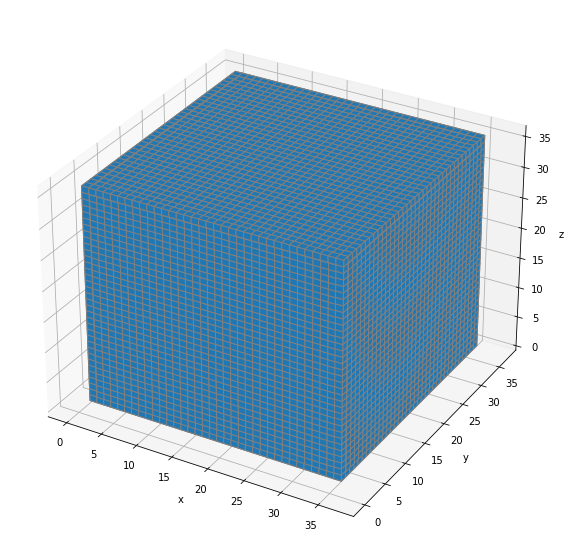

CPU times: user 14 s, sys: 173 ms, total: 14.2 s
Wall time: 14.3 s


In [9]:
%%time
#from holopy.scattering.scatterer import Indicators
#indi = Indicators(lambda x: sph_rule(x, R=0.5, delta=1))
#copa_sph = Scatterer(indi, n=1.5, center=(1,1,0))

from mpl_toolkits.mplot3d import Axes3D
def make_ax(grid=False):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection='3d')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.grid(grid)
    return ax

filam = np.array(copa_fil.voxelate(spacing=0.002), dtype=bool)

#filled = np.zeros((filam[:,0].max()+1, filam[:,1].max()+1, filam[:,2].max()+1), dtype=bool)
#for c in filam:
#    filled[c[0],c[1],c[2]] = True

ax = make_ax(True)
ax.voxels(filam, edgecolors='gray', shade=False)
plt.show()

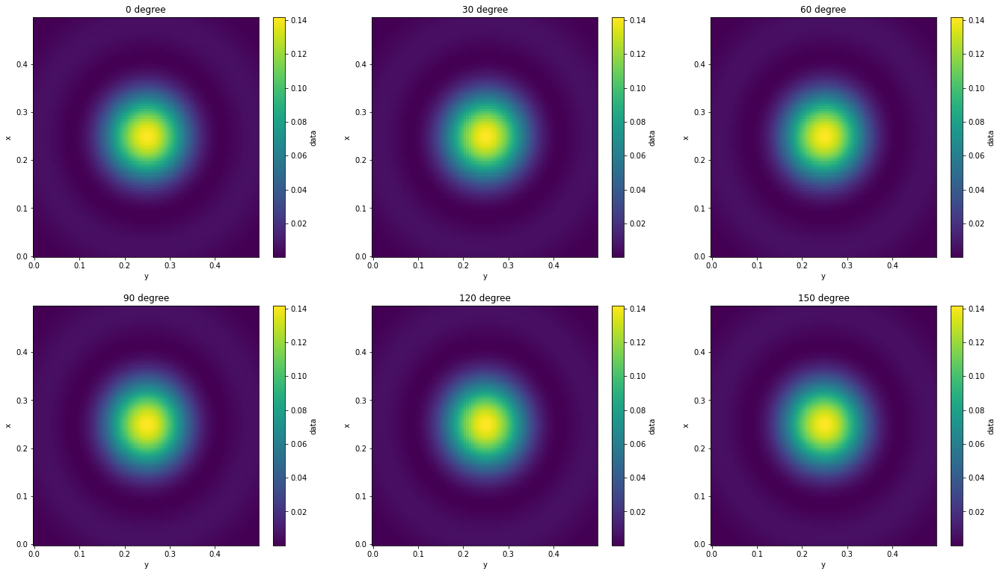

CPU times: user 20.9 s, sys: 1.23 s, total: 22.1 s
Wall time: 42.9 s


In [33]:
%%time
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(0.25,0.25,0))
detector = hp.detector_grid(100, .005)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
refl_len_dda = Lens(1.38, Backscattered(DDA(use_gpu=True, max_dpl_size=0.002))) # addacmd=['-orient',str(th),'0','0']))
holo_unp = calc_unpolar(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, theory=refl_len_dda)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

## rotated cube

In [31]:
def rota(ang,v=(np.sqrt(3),0,0)):
    a,b,g = ang
    R = [[np.cos(a)*np.cos(b)*np.cos(g)-np.sin(a)*np.sin(g), np.sin(a)*np.cos(b)*np.cos(g)+np.cos(a)*np.sin(g), -np.sin(b)*np.cos(g)], 
         [-np.cos(a)*np.cos(b)*np.sin(g)-np.sin(a)*np.cos(g), -np.sin(a)*np.cos(b)*np.sin(g), np.sin(b)*np.sin(g)], 
         [np.cos(a)*np.sin(b), np.sin(a)*np.sin(b), np.cos(b)]]
    R = np.array(R)
    return R@np.array(v)

In [32]:
a = 145*np.pi/180
b = np.arccos(1/np.sqrt(3))#45*np.pi/180
g = np.arccos(-1/np.sqrt(2))#45*np.pi/180
print('rotated',np.around(rota((a,b,g), (0,0,np.sqrt(3))), decimals=2))
print('beta',b*180/np.pi)
print('gamma',g*180/np.pi)

rotated [1. 1. 1.]
beta 54.735610317245346
gamma 135.0


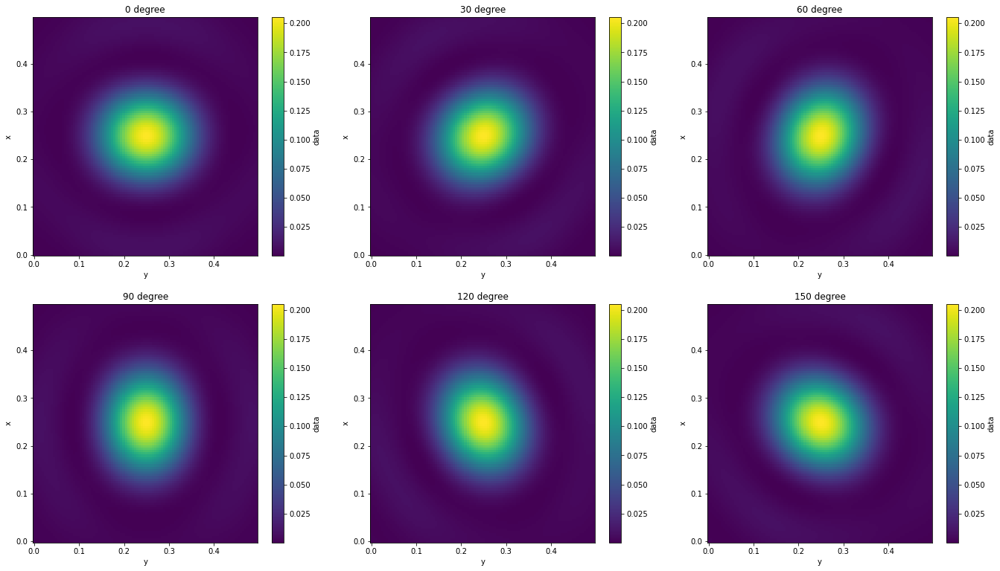

CPU times: user 20.7 s, sys: 1.27 s, total: 22 s
Wall time: 42.3 s


In [34]:
%%time
copa_fil = Scatterer(indi, n=0.0345+1j*2.859, center=(0.25,0.25,0))
detector = hp.detector_grid(100, .005)

holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
refl_len_dda = Lens(1.38, Backscattered(DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient','0','54.7356','135']))) # addacmd=['-orient',str(th),'0','0']))
holo_unp = calc_unpolar(detector, copa_fil, medium_index=1.515, illum_wavelen=0.465, theory=refl_len_dda)
for i,th in enumerate([0,30,60,90,120,150]):
    #th *= np.pi/180
    holo_fil[th] = apply_pol(holo_unp, th*np.pi/180)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(th)+' degree')
plt.show()

In [15]:
np.arccos(1/np.sqrt(3))/np.pi*180

54.73561031724534

In [24]:
def rota(ang,v=(np.sqrt(3),0,0)):
    a,b,g = ang
    R = [[np.cos(a)*np.cos(b)*np.cos(g)-np.sin(a)*np.sin(g), np.sin(a)*np.cos(b)*np.cos(g)+np.cos(a)*np.sin(g), -np.sin(b)*np.cos(g)], 
         [-np.cos(a)*np.cos(b)*np.sin(g)-np.sin(a)*np.cos(g), -np.sin(a)*np.cos(b)*np.sin(g), np.sin(b)*np.sin(g)], 
         [np.cos(a)*np.sin(b), np.sin(a)*np.sin(b), np.cos(b)]]
    R = np.array(R)
    return R@np.array(v)

In [27]:
a = 145*np.pi/180
b = np.arccos(1/np.sqrt(3))#45*np.pi/180
g = np.arccos(-1/np.sqrt(2))#45*np.pi/180
print('rotated',np.around(rota((a,b,g), (0,0,np.sqrt(3))), decimals=2))
print('beta',b*180/np.pi)
print('gamma',g*180/np.pi)

array([1., 1., 1.])

In [28]:
b*180/np.pi

54.735610317245346

In [29]:
g*180/np.pi

135.0

# PRESENTATION

In [5]:
def calc_unpolar(detector, scat, medium_index=1., illum_wavelen=0.4, theory=None):
    # X
    holo = calc_field(detector, scat, medium_index=medium_index, illum_wavelen=illum_wavelen, illum_polarization=(1,0), theory=theory)
    holo_x = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
    holo_x.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
    holo_x.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
    holo_x.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
    holo_x.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))


    # Y
    holo = calc_field(detector, scat, medium_index=medium_index, illum_wavelen=illum_wavelen, illum_polarization=(0,1), theory=theory)
    holo_y = abs(holo.sel(vector='z').expand_dims(dim={'S':['I','Q','U','V']})).drop('vector')
    holo_y.sel(S='I')[...] = np.abs(holo.sel(vector='y'))**2 + np.abs(holo.sel(vector='x'))**2
    holo_y.sel(S='Q')[...] = np.abs(holo.sel(vector='y'))**2 - np.abs(holo.sel(vector='x'))**2
    holo_y.sel(S='U')[...] = np.real(holo.sel(vector='y')*np.conj(holo.sel(vector='x')) + holo.sel(vector='x')*np.conj(holo.sel(vector='y')))
    holo_y.sel(S='V')[...] = np.imag(holo.sel(vector='x')*np.conj(holo.sel(vector='y')) - holo.sel(vector='y')*np.conj(holo.sel(vector='x')))
    return (holo_x + holo_y)/2

In [6]:
def apply_pol(holo_unp, th):
    return holo_unp.sel(S='I') + holo_unp.sel(S='Q')*np.cos(2*th) + holo_unp.sel(S='U')*np.sin(2*th)

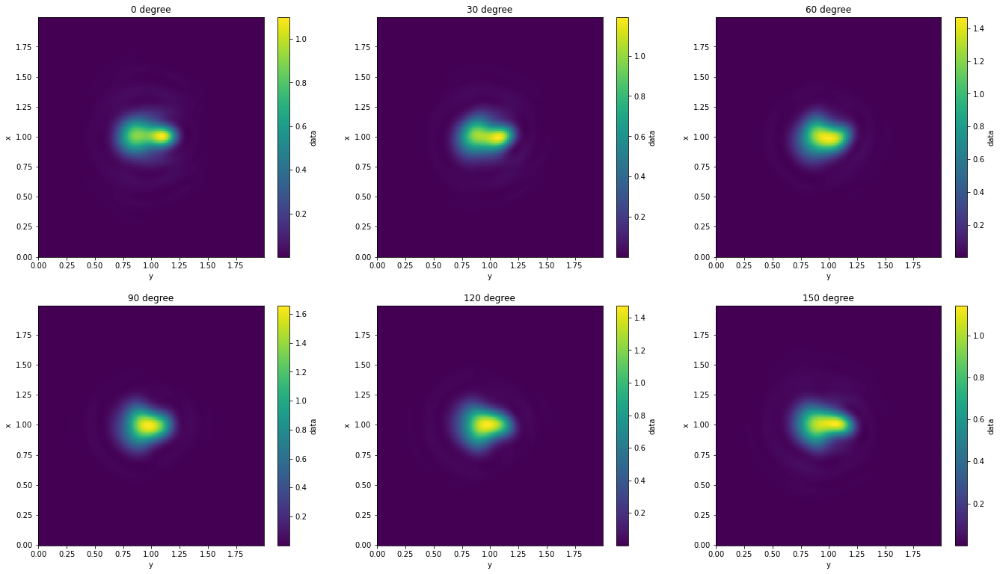

In [7]:
ell1 = Ellipsoid(r = (0.1,0.05,0.05), center = (0,-0.1,0))
ell2 = Ellipsoid(r = (0.05,0.1,0.5), center = (0,0.15,0))
detector = hp.detector_grid(200, .01)
biel = Scatterer(lambda point: np.logical_or(ell1.contains(point), ell2.contains(point)), n = 0.05+1j*2.1, center = (1, 1, 0))

# changing bounds by hand, since there is nothing in the center
# and default algorithm will fail
bond = np.array(biel.bounds)
c = biel.center
for i,b in enumerate(bond):
    bond[i,0] = min(ell1.bounds[i][0], ell2.bounds[i][0])
    bond[i,1] = max(ell1.bounds[i][1], ell2.bounds[i][1])
biel.indicators.bound = bond

len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
holo_unp = calc_unpolar(detector, scat=biel, medium_index=1.515, illum_wavelen=0.4, theory=len_dda)

fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    th *= np.pi/180
    holo_th = apply_pol(holo_unp, th) ###
    holo_th.plot(ax=axes[i])
    axes[i].set_title(str(round(th*180/np.pi))+' degree')
plt.show()

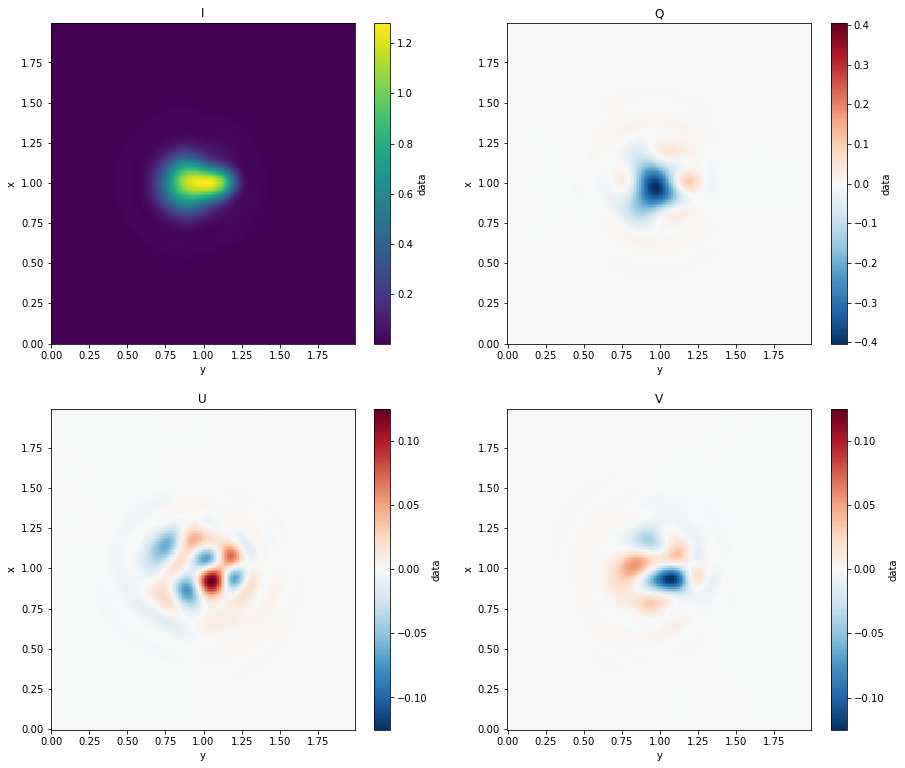

In [10]:

fig, axes = plt.subplots(2, 2, figsize=(15, 13))
axes = np.ravel(axes)
holo_unp.sel(S='I').plot(ax=axes[0])
axes[0].set_title('I')
holo_unp.sel(S='Q').plot(ax=axes[1])
axes[1].set_title('Q')
holo_unp.sel(S='U').plot(ax=axes[2])
axes[2].set_title('U')
holo_unp.sel(S='V').plot(ax=axes[3])
axes[3].set_title('V')
plt.show()

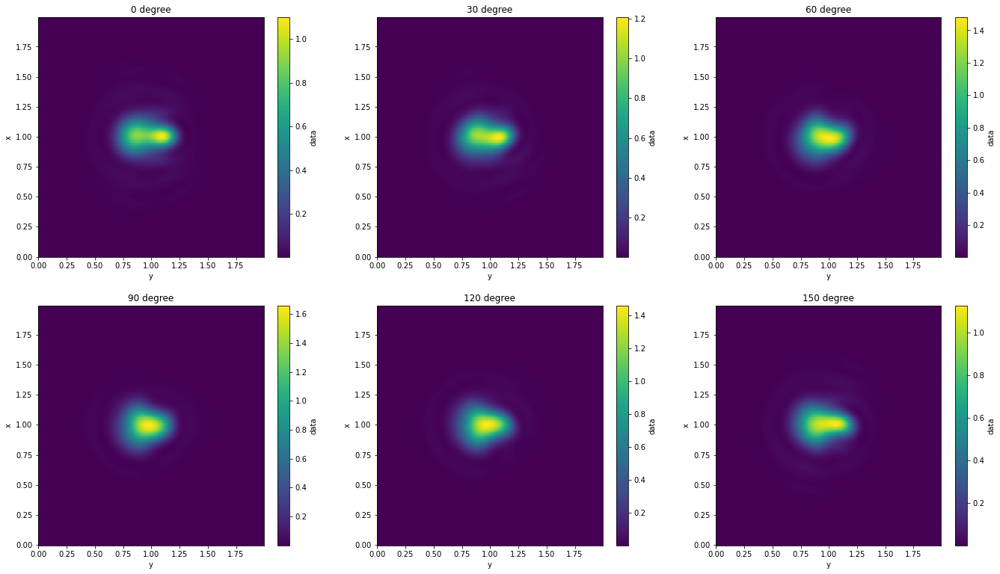

CPU times: user 4min 48s, sys: 36 s, total: 5min 24s
Wall time: 1min 29s


In [8]:
%%time
holo_fil = {}
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    th *= np.pi/180
    len_dda = Lens(1.38, DDA(use_gpu=True))#, addacmd=['-orient',str(th),'0','0']))
    holo = calc_field(detector, biel, medium_index=1.515, illum_wavelen=0.4, illum_polarization=(np.sin(th), np.cos(th)), theory=len_dda)
    holo_fil[th] = (np.abs(holo)**2).sum(dim='vector')
    #holo_fil[th][...,0] = skimage.transform.rotate(holo_fil[th][...,0], angle=-1*th, mode='edge', order=3)
    #axes[i].imshow(holo)
    holo_fil[th].plot(ax=axes[i])
    axes[i].set_title(str(round(th*180/np.pi))+' degree')
plt.show()

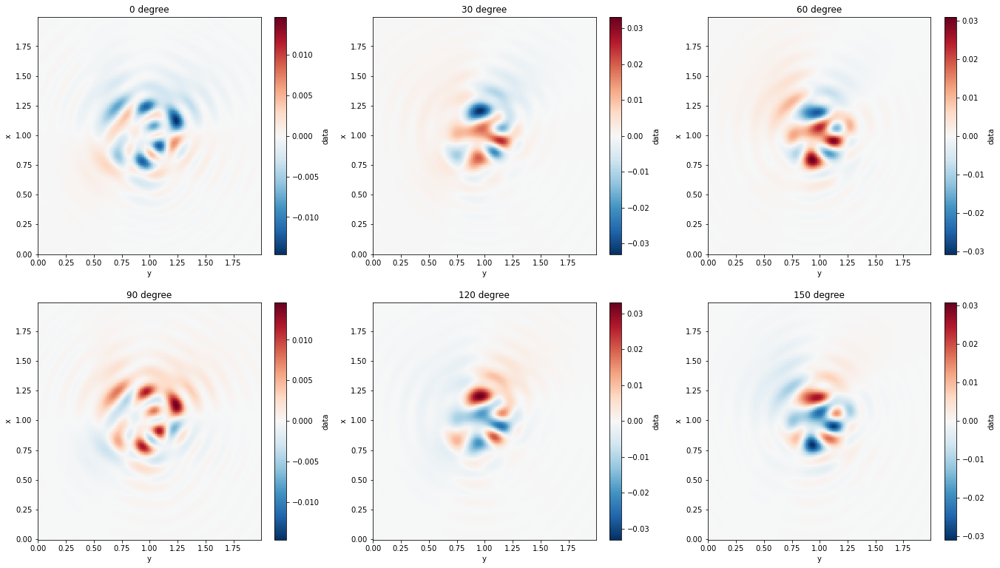

In [9]:
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    th *= np.pi/180
    holo_th = holo_fil[th] - (holo_unp.sel(S='I') + holo_unp.sel(S='Q')*np.cos(2*th) + holo_unp.sel(S='U')*np.sin(2*th)) ###
    holo_th.plot(ax=axes[i])
    axes[i].set_title(str(round(th*180/np.pi))+' degree')
plt.show()

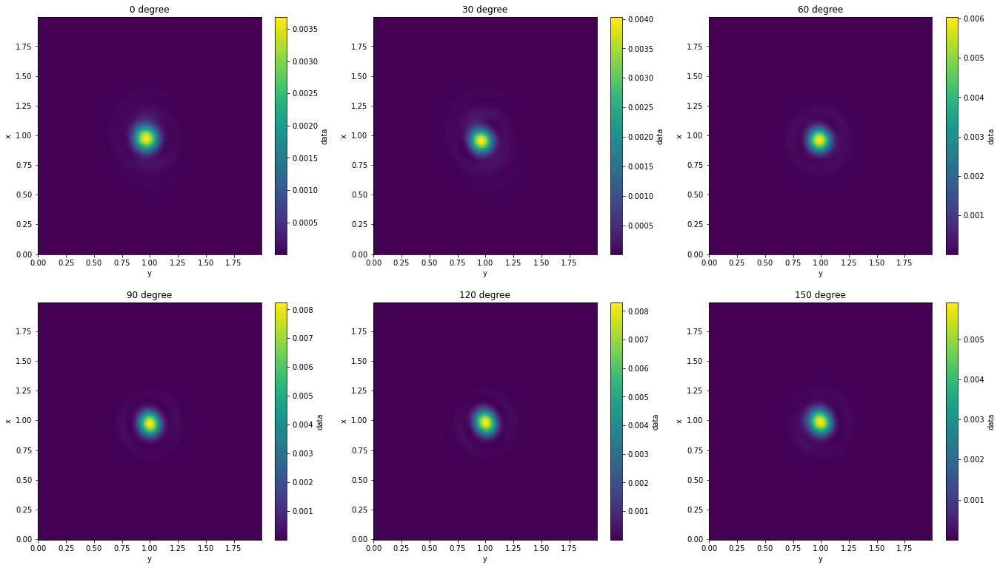

In [52]:
fig, axes = plt.subplots(2, 3, figsize=(23, 13))
axes = np.ravel(axes)
for i,th in enumerate([0,30,60,90,120,150]):
    th *= np.pi/180
    holo_th = apply_pol(holo_unp, th) ###
    holo_th.plot(ax=axes[i])
    axes[i].set_title(str(round(th*180/np.pi))+' degree')
plt.show()

In [67]:
def bright_cen(img, w=4):
    sh = img.shape
    peak = np.array(np.unravel_index(np.argmax(img),sh))
    peak[peak<w] = w
    bright = img[peak[0]-w:peak[0]+w+1,peak[1]-w:peak[1]+w+1]
    x,y = np.meshgrid(range(-w,w+1),range(-w,w+1))
    return peak[0]+np.sum(x*bright)/np.sum(bright), peak[1]+np.sum(y*bright)/np.sum(bright)

* 1 filament

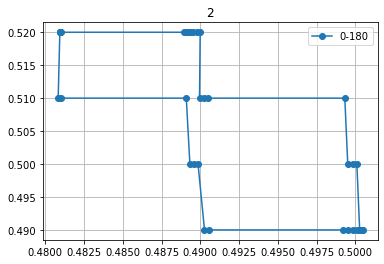

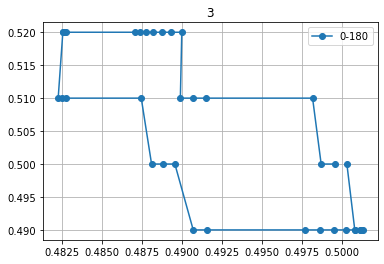

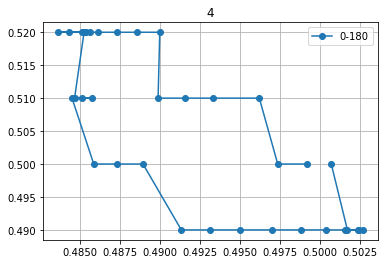

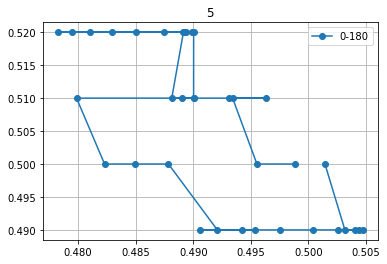

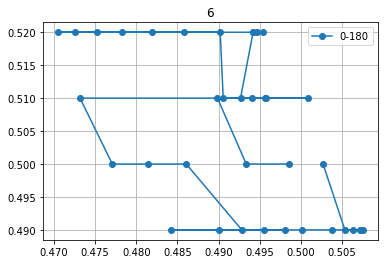

...

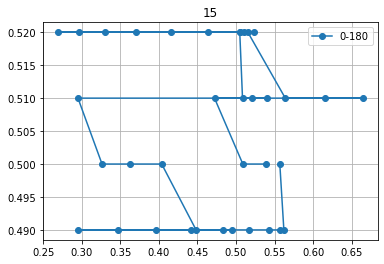

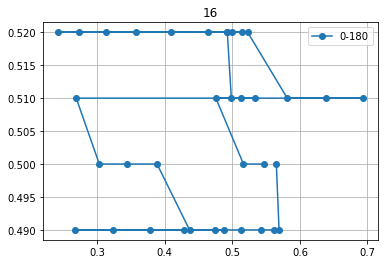

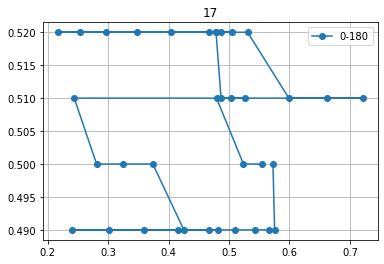

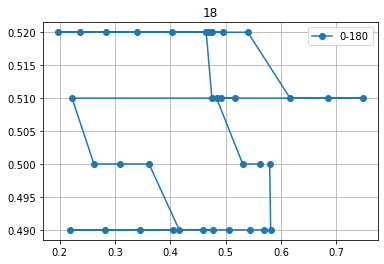

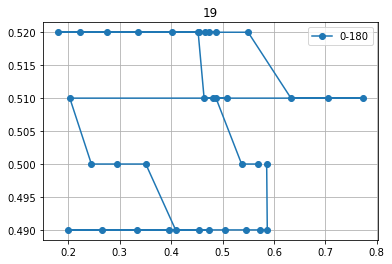

In [66]:
for w in range(2,20):
    br_peak = []
    for th in np.linspace(0,180,36, endpoint=False):
        br_peak.append(bright_cen(apply_pol(holo_unp, th*np.pi/180).values, w=w))
    br_peak = np.array(br_peak).T
    plt.plot(br_peak[1,:]*0.01, br_peak[0,:]*0.01, '-o', label='0-180')
    plt.legend()
    plt.grid()
    plt.title(str(w))
    plt.show()

* 2 filament

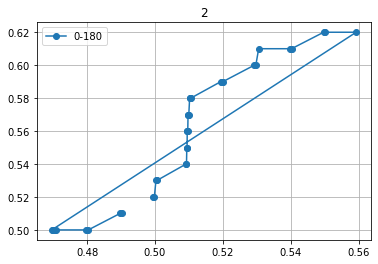

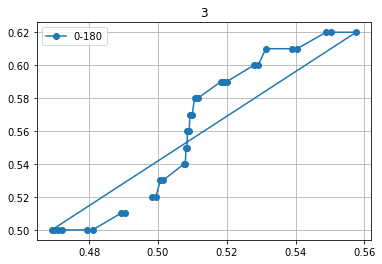

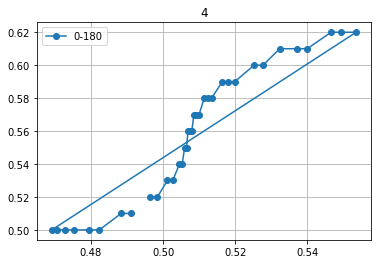

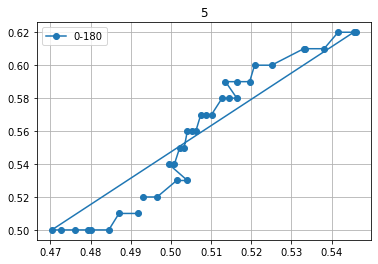

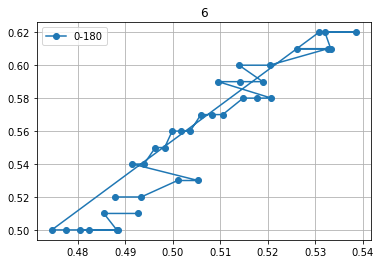

...

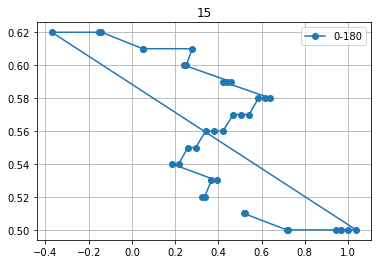

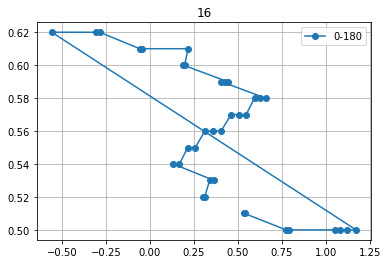

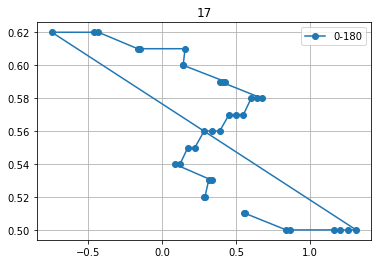

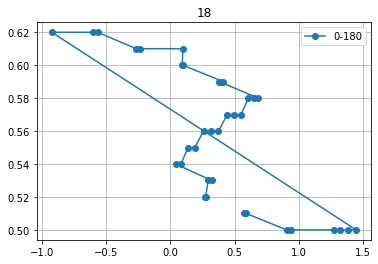

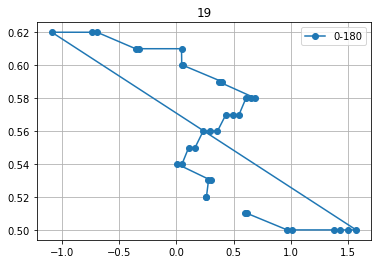

In [82]:
for w in range(2,20):
    br_peak = []
    for th in np.linspace(0,180,36, endpoint=False):
        br_peak.append(bright_cen(apply_pol(holo_unp, th*np.pi/180).values, w=w))
    br_peak = np.array(br_peak).T
    plt.plot(br_peak[1,:]*0.01, br_peak[0,:]*0.01, '-o', label='0-180')
    plt.legend()
    plt.grid()
    plt.title(str(w))
    plt.show()

# OLD
# OLD
# OLD

In [10]:
Ag_n = np.loadtxt('Ag_n.txt')
lamb_min = Ag_n[0,0]; lamb_max = Ag_n[-1,0]
m_ag = {}
m_ag['R'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,1], kind='cubic')
m_ag['I'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,2], kind='cubic')
#mask = (ag_n[:,0]>0.35) & (ag_n[:,0]<0.65)
#ag_mask = ag_n[mask]

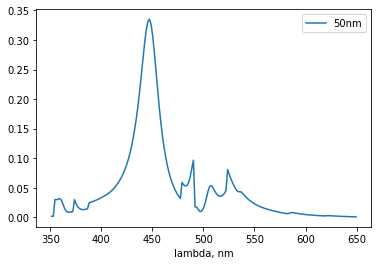

CPU times: user 28min 35s, sys: 1min 25s, total: 30min
Wall time: 7min 26s


In [4]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 50
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peaks = []
for lam,nr,ni in ag_mask:
    s_a = Sphere(n = nr+1j*ni, r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peaks.append(holo.max())
plt.plot(ag_mask[:,0]*1000, peaks, label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

In [28]:
Ag_n = np.loadtxt('Ag_wu14.txt')
lamb_min = Ag_n[0,0]; lamb_max = Ag_n[-1,0]
m_ag = {}
m_ag['R'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,1], kind='cubic')
m_ag['I'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,2], kind='cubic')
#mask = (ag_n[:,0]>0.35) & (ag_n[:,0]<0.65)
#ag_mask = ag_n[mask]

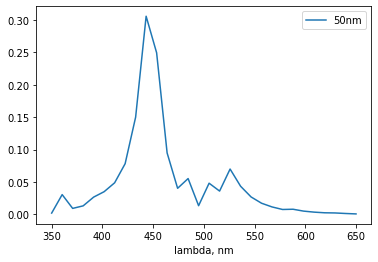

CPU times: user 4min 34s, sys: 13.8 s, total: 4min 47s
Wall time: 1min 11s


In [25]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 50
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peaks = []
for lam in np.linspace(0.35,0.65,30):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peaks.append(holo.max())
plt.plot(np.linspace(0.35,0.65,30)*1000, peaks, label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

In [18]:
Ag_n = np.loadtxt('Ag_we09.txt')
lamb_min = Ag_n[0,0]; lamb_max = Ag_n[-1,0]
m_ag = {}
m_ag['R'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,1], kind='cubic')
m_ag['I'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,2], kind='cubic')
#mask = (ag_n[:,0]>0.35) & (ag_n[:,0]<0.65)
#ag_mask = ag_n[mask]

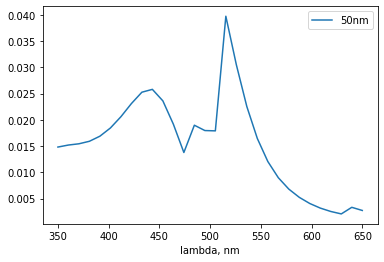

CPU times: user 4min 34s, sys: 14.4 s, total: 4min 48s
Wall time: 1min 11s


In [19]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 50
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peaks = []
for lam in np.linspace(0.35,0.65,30):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peaks.append(holo.max())
plt.plot(np.linspace(0.35,0.65,30)*1000, peaks, label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

In [20]:
Ag_n = np.loadtxt('Ag_jc72.txt')
lamb_min = Ag_n[0,0]; lamb_max = Ag_n[-1,0]
m_ag = {}
m_ag['R'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,1], kind='cubic')
m_ag['I'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,2], kind='cubic')
#mask = (ag_n[:,0]>0.35) & (ag_n[:,0]<0.65)
#ag_mask = ag_n[mask]

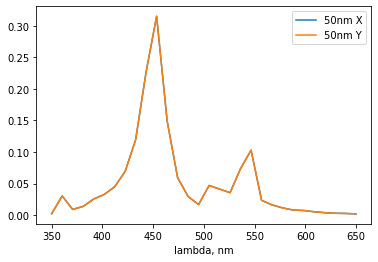

CPU times: user 9min 7s, sys: 27.1 s, total: 9min 34s
Wall time: 2min 23s


In [23]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 50
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peaksx, peaksy = [],[]
for lam in np.linspace(0.35,0.65,30):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peaksx.append(holo.max())
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(0,1), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peaksy.append(holo.max())
plt.plot(np.linspace(0.35,0.65,30)*1000, peaksx, label=str(d)+'nm X')
plt.plot(np.linspace(0.35,0.65,30)*1000, peaksy, label=str(d)+'nm Y')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

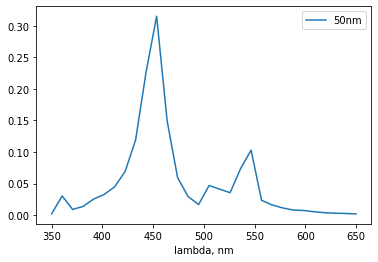

In [22]:
plt.plot(np.linspace(0.35,0.65,30)*1000, peaks, label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

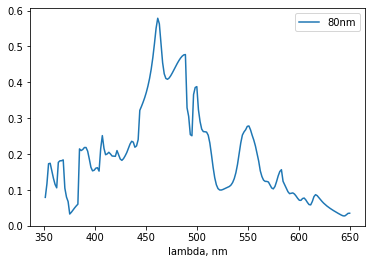

In [27]:
plt.plot(ag_mask[:,0]*1000, peakss, label=str(80)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

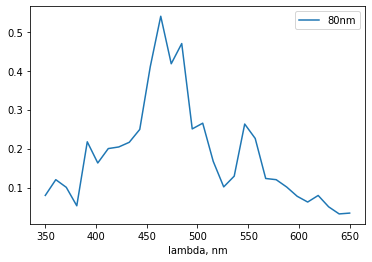

CPU times: user 4min 33s, sys: 13.9 s, total: 4min 47s
Wall time: 1min 12s


In [14]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 80
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peakss_i = []
for lam in np.linspace(0.35,0.65,30):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,1), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peakss_i.append(holo.max())
plt.plot(np.linspace(0.35,0.65,30)*1000, peakss_i, label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

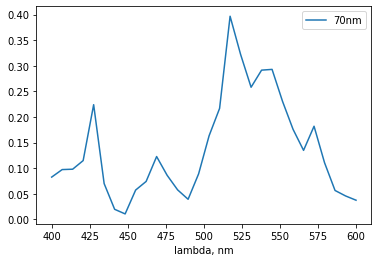

CPU times: user 4min 34s, sys: 14 s, total: 4min 48s
Wall time: 1min 12s


In [31]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 70
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peakss_i = []
for lam in np.linspace(0.4,0.6,30):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,1), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peakss_i.append(holo.max())
plt.plot(np.linspace(0.4,0.6,30)*1000, peakss_i, label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

# 40-60-100 nm

In [3]:
Ag_n = np.loadtxt('Ag_wu14.txt')
lamb_min = Ag_n[0,0]; lamb_max = Ag_n[-1,0]
m_ag = {}
m_ag['R'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,1])#, kind='cubic')
m_ag['I'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,2])#, kind='cubic')
#mask = (ag_n[:,0]>0.35) & (ag_n[:,0]<0.65)
#ag_mask = ag_n[mask]

In [4]:
peak_sph = {}

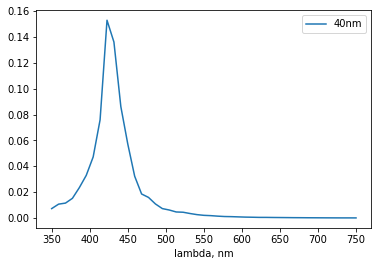

CPU times: user 6min 49s, sys: 20.5 s, total: 7min 10s
Wall time: 4min 8s


In [6]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA(max_dpl_size=0.002, use_gpu=True))
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,45):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

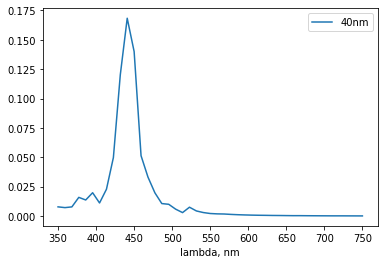

CPU times: user 8min 57s, sys: 22.1 s, total: 9min 19s
Wall time: 2min 35s


In [8]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA(max_dpl_size=d*1e-4))
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,45):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

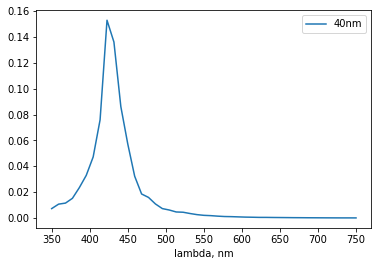

CPU times: user 6min 54s, sys: 20.7 s, total: 7min 15s
Wall time: 4min 10s


In [16]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA(max_dpl_size=0.002))
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,45):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

In [136]:
np.linspace(0.35,0.65,20)*1000

array([350.        , 365.78947368, 381.57894737, 397.36842105,
       413.15789474, 428.94736842, 444.73684211, 460.52631579,
       476.31578947, 492.10526316, 507.89473684, 523.68421053,
       539.47368421, 555.26315789, 571.05263158, 586.84210526,
       602.63157895, 618.42105263, 634.21052632, 650.        ])

In [141]:
mask40 = np.ones_like(np.linspace(0.35,0.65,20)*1000, dtype=bool)
mask40[3] = False#; mask[-4] = False

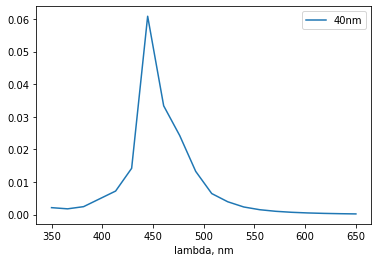

In [142]:
d=40
plt.plot((np.linspace(0.35,0.65,20)*1000)[mask40], np.array(peak_sph[str(d)])[mask40], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
#plt.xlim(0.44, 0.75)
plt.show()

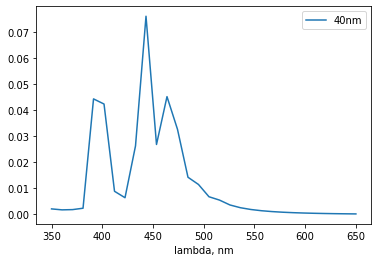

CPU times: user 5min 59s, sys: 15 s, total: 6min 14s
Wall time: 1min 41s


In [101]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.65,30):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.65,30)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

# 60

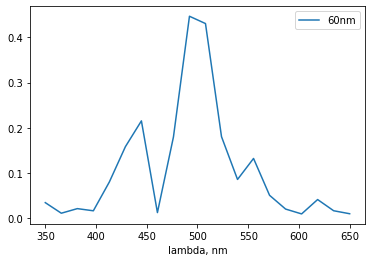

CPU times: user 4min, sys: 10.3 s, total: 4min 10s
Wall time: 1min 9s


In [109]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 60
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.65,20):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.65,20)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

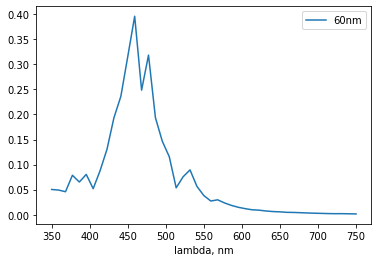

CPU times: user 8min 56s, sys: 21.4 s, total: 9min 18s
Wall time: 2min 34s


In [9]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 60
len_dda = Lens(1.38, DDA(max_dpl_size=d*1e-4))
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,45):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

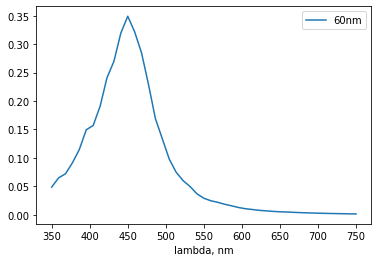

CPU times: user 6min 56s, sys: 20.3 s, total: 7min 16s
Wall time: 10min 50s


In [15]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 60
len_dda = Lens(1.38, DDA(max_dpl_size=0.002))
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,45):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

In [128]:
np.linspace(0.35,0.65,20)*1000

array([350.        , 365.78947368, 381.57894737, 397.36842105,
       413.15789474, 428.94736842, 444.73684211, 460.52631579,
       476.31578947, 492.10526316, 507.89473684, 523.68421053,
       539.47368421, 555.26315789, 571.05263158, 586.84210526,
       602.63157895, 618.42105263, 634.21052632, 650.        ])

In [148]:
mask60 = np.ones_like(np.linspace(0.35,0.65,20)*1000, dtype=bool)
mask60[7] = False#; mask[-4] = False

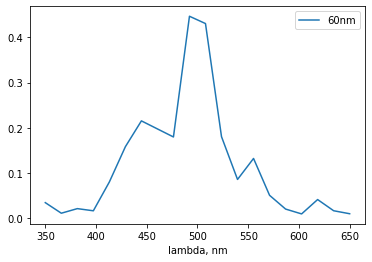

In [135]:
plt.plot((np.linspace(0.35,0.65,20)*1000)[mask60], np.array(peak_sph[str(60)])[mask60], label=str(60)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
#plt.xlim(0.44, 0.75)
plt.show()

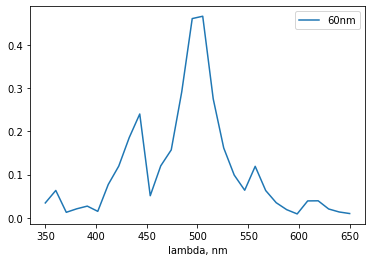

CPU times: user 5min 59s, sys: 14.8 s, total: 6min 14s
Wall time: 1min 42s


In [102]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 60
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.65,30):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.65,30)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

# 100

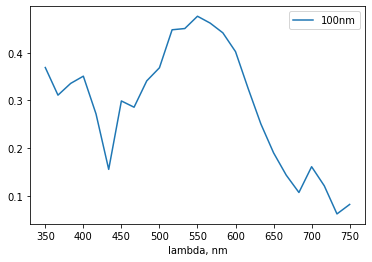

CPU times: user 4min 17s, sys: 12.8 s, total: 4min 29s
Wall time: 1min 7s


In [116]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 100
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,25):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,25)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

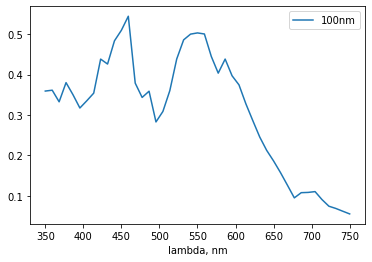

CPU times: user 8min 58s, sys: 24.8 s, total: 9min 23s
Wall time: 3min


In [13]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 100
len_dda = Lens(1.38, DDA(max_dpl_size=0.01))
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,45):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

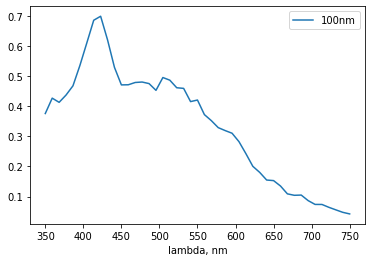

CPU times: user 8min 58s, sys: 22 s, total: 9min 20s
Wall time: 7min 29s


In [11]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 100
len_dda = Lens(1.38, DDA(max_dpl_size=0.004))
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,45):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

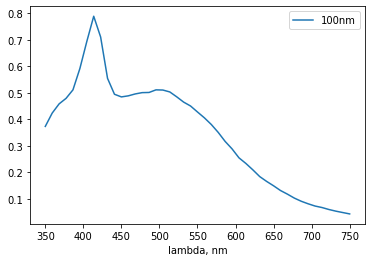

CPU times: user 7min 6s, sys: 20.5 s, total: 7min 27s
Wall time: 46min 20s


In [14]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 100
len_dda = Lens(1.38, DDA(max_dpl_size=0.002))
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.35,0.75,45):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.35,0.75,45)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

In [121]:
np.linspace(0.35,0.75,25)*1000

array([350.        , 366.66666667, 383.33333333, 400.        ,
       416.66666667, 433.33333333, 450.        , 466.66666667,
       483.33333333, 500.        , 516.66666667, 533.33333333,
       550.        , 566.66666667, 583.33333333, 600.        ,
       616.66666667, 633.33333333, 650.        , 666.66666667,
       683.33333333, 700.        , 716.66666667, 733.33333333,
       750.        ])

In [146]:
mask100 = np.ones_like(np.linspace(0.35,0.75,25)*1000, dtype=bool)
mask100[:5] = False; mask100[-6:] = False

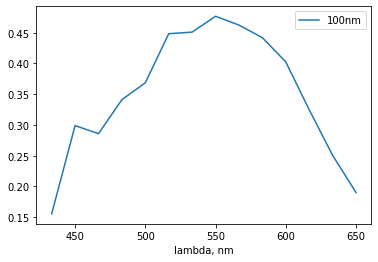

In [147]:
d=100
plt.plot((np.linspace(0.35,0.75,25)*1000)[mask100], np.array(peak_sph[str(d)])[mask100], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
#plt.xlim(0.44, 0.75)
plt.show()

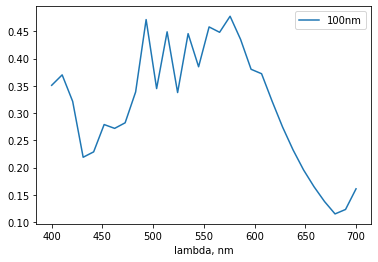

CPU times: user 5min 59s, sys: 14.8 s, total: 6min 14s
Wall time: 1min 51s


In [103]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 100
len_dda = Lens(1.38, DDA())
detector = hp.detector_grid(100, .01)

peak_sph[str(d)] = []
for lam in np.linspace(0.4,0.7,30):
    s_a = Sphere(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = d/2*1e-3, center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_sph[str(d)].append(holo.max())
plt.plot(np.linspace(0.4,0.7,30)*1000, peak_sph[str(d)], label=str(d)+'nm')
plt.legend()
plt.xlabel('lambda, nm')
plt.show()

In [149]:
import gc
gc.collect()

28004

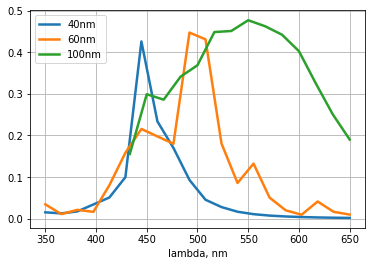

In [156]:
mask = {40:mask40, 60:mask60, 100:mask100}
space = {40:np.linspace(0.35,0.65,20)*1000, 60:np.linspace(0.35,0.65,20)*1000, 100:np.linspace(0.35,0.75,25)*1000}
for d in [40,60,100]:
    if d==40: plt.plot(space[d][mask[d]], 7*np.array(peak_sph[str(d)])[mask[d]], label=str(d)+'nm', linewidth=2.5)
    else: plt.plot(space[d][mask[d]], np.array(peak_sph[str(d)])[mask[d]], label=str(d)+'nm', linewidth=2.5)
plt.legend()
plt.xlabel('lambda, nm')
plt.grid()
plt.show()

### dielectric

5.099341881369429e-05
0.0006159589008923976
0.015027002681184528


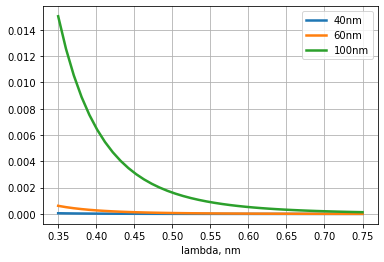

CPU times: user 27min 59s, sys: 59.8 s, total: 28min 58s
Wall time: 13min 22s


In [182]:
%%time
len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002))
detector = hp.detector_grid(100, .01)
peak_diel = {}
for d in [40,60,100]:
    peak_diel[d] = []
    for lam in np.linspace(0.35,0.75,40):
        s_a = Sphere(n = 1.515, r = d/2*1e-3, center = (0.5,0.5,0))
        holo = calc_field(detector, s_a, medium_index=1., illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
        holo = (np.abs(holo)**2).sum(dim='vector')
        peak_diel[d].append(holo.max())
    plt.plot(np.linspace(0.35,0.75,40), np.array(peak_diel[d]), label=str(d)+'nm', linewidth=2.5)
    print(np.max(peak_diel[d]))
plt.legend()
plt.xlabel('lambda, nm')
plt.grid()
plt.show()

5.099341881369429e-05
0.0006159589008923976
0.015027002681184528


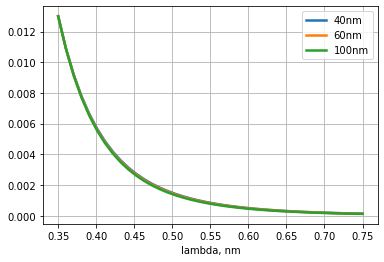

In [183]:
for d in [40,60,100]:
    plt.plot(np.linspace(0.35,0.75,40), np.array(peak_diel[d])*0.013/np.max(peak_diel[d]), label=str(d)+'nm', linewidth=2.5)
    print(np.max(peak_diel[d]))
plt.legend()
plt.xlabel('lambda, nm')
plt.grid()
plt.show()

3.424096062097464e-05
0.0004259724629286459
0.013795612659300337


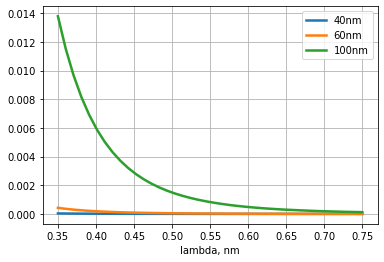

CPU times: user 18min 13s, sys: 55.7 s, total: 19min 8s
Wall time: 4min 49s


In [161]:
%%time
len_dda = Lens(1.38, DDA(max_dpl_size=0.002))
detector = hp.detector_grid(100, .01)
peak_diel = {}
for d in [40,60,100]:
    peak_diel[d] = []
    for lam in np.linspace(0.35,0.75,40):
        s_a = Sphere(n = 1.515, r = d/2*1e-3, center = (0.5,0.5,0))
        holo = calc_field(detector, s_a, medium_index=1., illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
        holo = (np.abs(holo)**2).sum(dim='vector')
        peak_diel[d].append(holo.max())
    plt.plot(np.linspace(0.35,0.75,40), np.array(peak_diel[d]), label=str(d)+'nm', linewidth=2.5)
    print(np.max(peak_diel[d]))
plt.legend()
plt.xlabel('lambda, nm')
plt.grid()
plt.show()

3.424096062097464e-05
0.0004259724629286459
0.013795612659300337


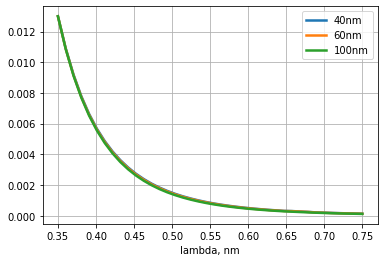

In [162]:
for d in [40,60,100]:
    plt.plot(np.linspace(0.35,0.75,40), np.array(peak_diel[d])*0.013/np.max(peak_diel[d]), label=str(d)+'nm', linewidth=2.5)
    print(np.max(peak_diel[d]))
plt.legend()
plt.xlabel('lambda, nm')
plt.grid()
plt.show()

## Ellipsoid peak

In [3]:
Ag_n = np.loadtxt('Ag_wu14.txt')
lamb_min = Ag_n[0,0]; lamb_max = Ag_n[-1,0]
m_ag = {}
m_ag['R'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,1])#, kind='cubic')
m_ag['I'] = sp.interpolate.interp1d(Ag_n[:,0], Ag_n[:,2])#, kind='cubic')
#mask = (ag_n[:,0]>0.35) & (ag_n[:,0]<0.65)
#ag_mask = ag_n[mask]

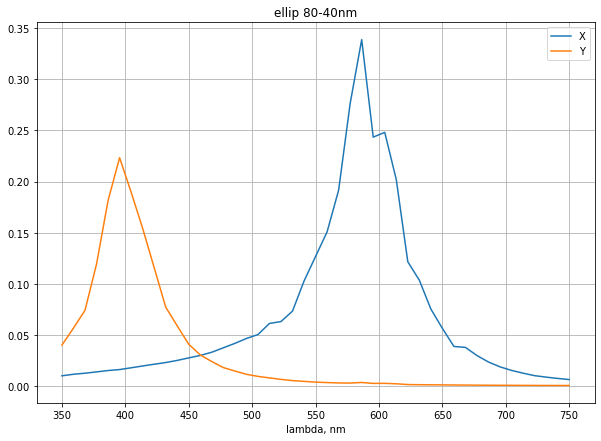

CPU times: user 21min 7s, sys: 45 s, total: 21min 52s
Wall time: 15min


In [184]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
detector = hp.detector_grid(100, .01)

peak_el = [[],[]]
for lam in np.linspace(0.35,0.75,45):
    len_dda = Lens(1.38, DDA(max_dpl_size=0.002, use_gpu=True))
    s_a = Ellipsoid(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = (d*1e-3,d/2*1e-3,d/2*1e-3), center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_el[0].append(holo.max())
    
    len_dda = Lens(1.38, DDA(use_gpu=True, max_dpl_size=0.002, addacmd=['-orient','90','0','0']))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_el[1].append(holo.max())
    #holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(0,1), theory=len_dda) #np.linspace(0.42,0.48,5)
    #holo = (np.abs(holo)**2).sum(dim='vector')
    #peak_ely[1].append(holo.max())

plt.figure(figsize=(10,7))
plt.plot((np.linspace(0.35,0.75,45)*1000), np.array(peak_el[0]), label='X', linewidth=2.5)
plt.plot((np.linspace(0.35,0.75,45)*1000), np.array(peak_el[1]), label='Y', linewidth=2.5)
plt.legend()
plt.grid()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

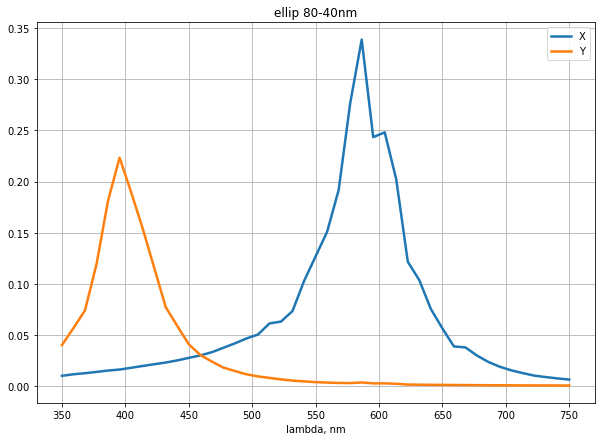

In [185]:
plt.figure(figsize=(10,7))
plt.plot((np.linspace(0.35,0.75,45)*1000), np.array(peak_el[0]), label='X', linewidth=2.5)
plt.plot((np.linspace(0.35,0.75,45)*1000), np.array(peak_el[1]), label='Y', linewidth=2.5)
plt.legend()
plt.grid()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

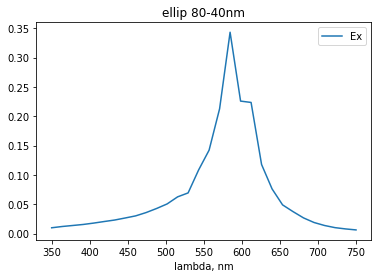

CPU times: user 5min 15s, sys: 18.6 s, total: 5min 34s
Wall time: 17min 14s


In [4]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA(max_dpl_size=0.002))
detector = hp.detector_grid(100, .01)

peak_el = [[],[]]
for lam in np.linspace(0.35,0.75,30):
    s_a = Ellipsoid(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = (d*1e-3,d/2*1e-3,d/2*1e-3), center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_el[0].append(holo.max())
    #holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(0,1), theory=len_dda) #np.linspace(0.42,0.48,5)
    #holo = (np.abs(holo)**2).sum(dim='vector')
    #peak_el[1].append(holo.max())
plt.plot(np.linspace(0.35,0.75,30)*1000, peak_el[0], label='Ex')
#plt.plot(np.linspace(0.35,0.75,30)*1000, peak_el[1], label='Ey')
plt.legend()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

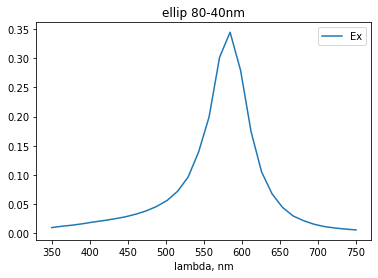

CPU times: user 4min 50s, sys: 19 s, total: 5min 9s
Wall time: 1min 44s


In [9]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA(max_dpl_size=0.004, use_gpu=True))
detector = hp.detector_grid(100, .01)

#peak_el = [[],[]]
for lam in np.linspace(0.35,0.75,30):
    s_a = Ellipsoid(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = (d*1e-3,d/2*1e-3,d/2*1e-3), center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_el[1].append(holo.max())
    #holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(0,1), theory=len_dda) #np.linspace(0.42,0.48,5)
    #holo = (np.abs(holo)**2).sum(dim='vector')
    #peak_el[1].append(holo.max())
plt.plot(np.linspace(0.35,0.75,30)*1000, peak_el[0], label='Ex')
#plt.plot(np.linspace(0.35,0.75,30)*1000, peak_el[1], label='Ey')
plt.legend()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

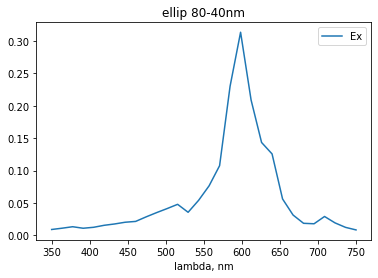

In [10]:
plt.plot(np.linspace(0.35,0.75,30)*1000, peak_el[1], label='Ex')
#plt.plot(np.linspace(0.35,0.75,30)*1000, peak_el[1], label='Ey')
plt.legend()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

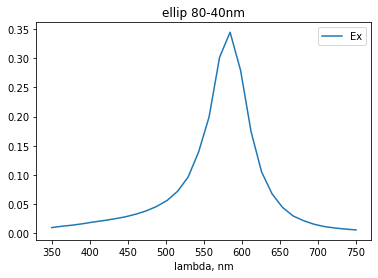

CPU times: user 4min 58s, sys: 19.1 s, total: 5min 17s
Wall time: 30min 48s


In [6]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA(max_dpl_size=0.001, use_gpu=True))
detector = hp.detector_grid(100, .01)

peak_el = [[],[]]
for lam in np.linspace(0.35,0.75,30):
    s_a = Ellipsoid(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = (d*1e-3,d/2*1e-3,d/2*1e-3), center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_el[0].append(holo.max())
    #holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(0,1), theory=len_dda) #np.linspace(0.42,0.48,5)
    #holo = (np.abs(holo)**2).sum(dim='vector')
    #peak_el[1].append(holo.max())
plt.plot(np.linspace(0.35,0.75,30)*1000, peak_el[0], label='Ex')
#plt.plot(np.linspace(0.35,0.75,30)*1000, peak_el[1], label='Ey')
plt.legend()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

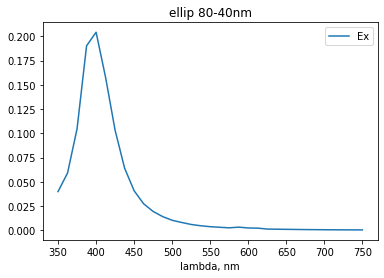

CPU times: user 5min 20s, sys: 21.1 s, total: 5min 41s
Wall time: 5min 33s


In [7]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA(max_dpl_size=0.002, use_gpu=True))
detector = hp.detector_grid(100, .01)

peak_ely = [[],[]]
for lam in np.linspace(0.35,0.75,33):
    s_a = Ellipsoid(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = (d/2*1e-3,d*1e-3,d/2*1e-3), center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_ely[0].append(holo.max())
    #holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(0,1), theory=len_dda) #np.linspace(0.42,0.48,5)
    #holo = (np.abs(holo)**2).sum(dim='vector')
    #peak_ely[1].append(holo.max())
plt.plot(np.linspace(0.35,0.75,33)*1000, peak_ely[0], label='Ex')
#plt.plot(np.linspace(0.35,0.75,33)*1000, peak_ely[1], label='Ey')
plt.legend()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

In [41]:
np.linspace(0.35,0.75,33)*1000

array([350. , 362.5, 375. , 387.5, 400. , 412.5, 425. , 437.5, 450. ,
       462.5, 475. , 487.5, 500. , 512.5, 525. , 537.5, 550. , 562.5,
       575. , 587.5, 600. , 612.5, 625. , 637.5, 650. , 662.5, 675. ,
       687.5, 700. , 712.5, 725. , 737.5, 750. ])

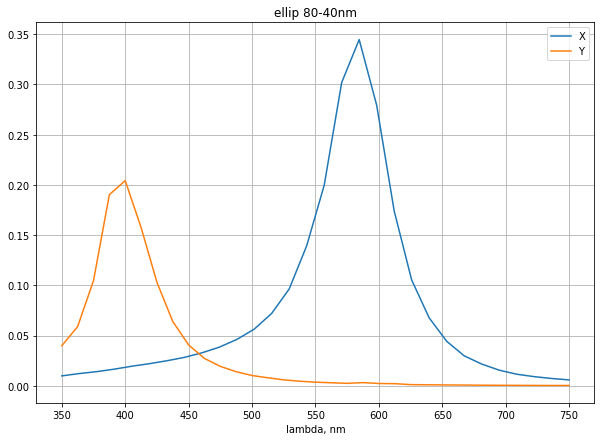

In [8]:
mask = np.ones_like(np.linspace(0.35,0.75,30)*1000, dtype=bool)
masky = np.ones_like(np.linspace(0.35,0.75,33)*1000, dtype=bool)
#mask[16] = False
#masky[6] = False; masky[13] = False
plt.figure(figsize=(10,7))
plt.plot((np.linspace(0.35,0.75,30)*1000)[mask], np.array(peak_el[0])[mask], label='X')
plt.plot((np.linspace(0.35,0.75,33)*1000)[masky], np.array(peak_ely[0])[masky], label='Y')
plt.legend()
plt.grid()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

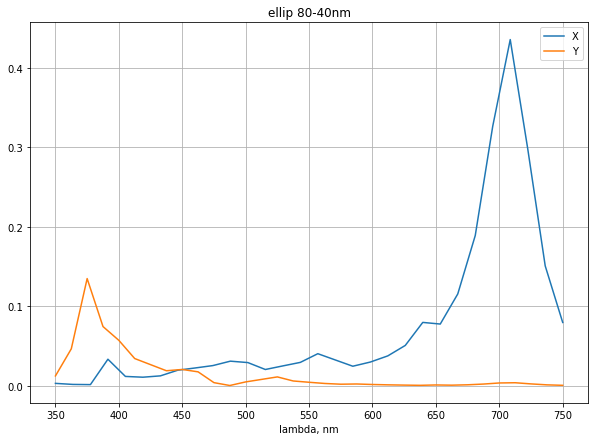

In [61]:
mask = np.ones_like(np.linspace(0.35,0.75,30)*1000, dtype=bool)
masky = np.ones_like(np.linspace(0.35,0.75,33)*1000, dtype=bool)
#mask[16] = False
#masky[6] = False; masky[13] = False
plt.figure(figsize=(10,7))
plt.plot((np.linspace(0.35,0.75,30)*1000)[mask], np.array(peak_el[0])[mask], label='X')
plt.plot((np.linspace(0.35,0.75,33)*1000)[masky], np.array(peak_ely[1])[masky], label='Y')
plt.legend()
plt.grid()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

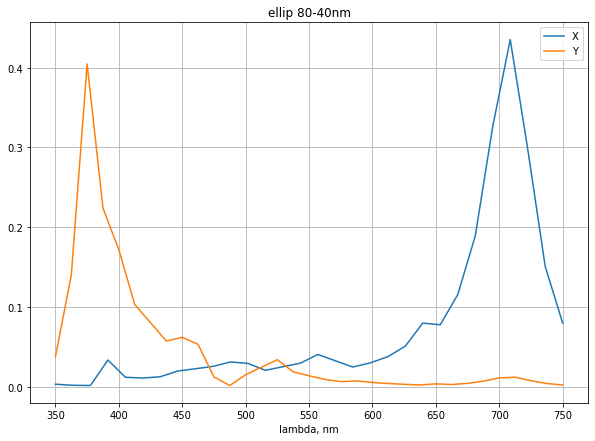

In [164]:
d=40
mask = np.ones_like(np.linspace(0.35,0.75,30)*1000, dtype=bool)
masky = np.ones_like(np.linspace(0.35,0.75,33)*1000, dtype=bool)
mask[16] = False
masky[6] = False; masky[13] = False
plt.figure(figsize=(10,7))
plt.plot((np.linspace(0.35,0.75,30)*1000)[mask], np.array(peak_el[0])[mask], label='X')
plt.plot((np.linspace(0.35,0.75,33)*1000)[masky], np.array(peak_ely[1])[masky]*3, label='Y')
plt.legend()
plt.grid()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

In [11]:
peak_eld = [peak_el[1], [], peak_el[0]]

In [12]:
%%time
#ell = Ellipsoid(n = 0.05+1j*2.1, r = (0.05,0.025,0.025), center = (0.5,0.5,0))
d = 40
len_dda = Lens(1.38, DDA(max_dpl_size=0.002, use_gpu=True))
detector = hp.detector_grid(100, .01)

#peak_el = [[],[]]
for lam in np.linspace(0.35,0.75,30):
    s_a = Ellipsoid(n = m_ag['R'](lam)+1j*m_ag['I'](lam), r = (d*1e-3,d/2*1e-3,d/2*1e-3), center = (0.5,0.5,0))
    holo = calc_field(detector, s_a, medium_index=1.515, illum_wavelen=lam, illum_polarization=(1,0), theory=len_dda) #np.linspace(0.42,0.48,5)
    holo = (np.abs(holo)**2).sum(dim='vector')
    peak_eld[1].append(holo.max())

CPU times: user 4min 50s, sys: 19.7 s, total: 5min 10s
Wall time: 4min 45s


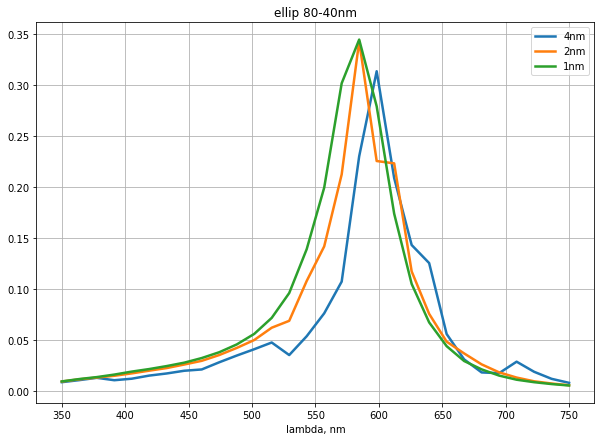

In [14]:
plt.figure(figsize=(10,7))
plt.plot((np.linspace(0.35,0.75,30)*1000), np.array(peak_eld[0]), label='4nm', linewidth=2.5)
plt.plot((np.linspace(0.35,0.75,30)*1000), np.array(peak_eld[1]), label='2nm', linewidth=2.5)
plt.plot((np.linspace(0.35,0.75,30)*1000), np.array(peak_eld[2]), label='1nm', linewidth=2.5)
plt.legend()
plt.grid()
plt.xlabel('lambda, nm')
plt.title('ellip '+str(d*2)+'-'+str(d)+'nm')
plt.show()

In [ ]:
r1 = (50,25); r2 = (50,75)
la = 0.4
copa = np.zeros((100,100))
def r_xy(x, y, r):
    pix = 0.1
    return np.sqrt((x-r[0])**2+(y-r[1])**2 +(50)**2)*pix * 2*np.pi/la
def interf(x, y, r1, r2):
    #return 1 + np.cos(r_xy(x, y, r1)-r_xy(x, y, r2)) + r_xy(x, y, r1)*np.sin(r_xy(x, y, r2)) + r_xy(x, y, r2)*np.sin(r_xy(x, y, r1))
    return 1/r_xy(x, y, r1)**2 + 1/r_xy(x, y, r2)**2 + 2*np.cos(r_xy(x, y, r1)-r_xy(x, y, r2))/(r_xy(x, y, r1)*r_xy(x, y, r2))
for i in range(100):
    for j in range(100):
        copa[i,j] = interf(i,j,r1,r2)
plt.imshow(copa)
plt.colorbar()
plt.draw()
plt.show()


## 3D-plot the scatterer

In [ ]:

_='''
from mpl_toolkits.mplot3d import Axes3D
def make_ax(grid=False):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.grid(grid)
    return ax

filam = np.array(dumbbell.voxelate(0.03), dtype=bool)
#filled = np.zeros((filam[:,0].max()+1, filam[:,1].max()+1, filam[:,2].max()+1), dtype=bool)
#for c in filam:
#    filled[c[0],c[1],c[2]] = True

ax = make_ax(True)
ax.voxels(filam, edgecolors='gray', shade=False)
plt.show()
'''